In [1]:
# Importing the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpl_patches
import seaborn as sns
from matplotlib.colors import TwoSlopeNorm, LinearSegmentedColormap
from sklearn.utils import resample
from io import BytesIO
import joblib
import os
from scipy.stats import ttest_rel
import matplotlib.gridspec as gridspec

In [2]:
from src.PRIZM_classes import ZeroShotModellerModule, PlottingModule
from src.PRIZM_helper_functions import one_sided_ttest, one_sided_ttest_paired_1samp

def cohens_d_paired(a, b):
    diffs = a - b
    return np.mean(diffs) / np.std(diffs, ddof=1)

In [3]:
# Initialize PRIZM
model_list = ['ESM1b','ESM1v','ESM2','Progen2','ProtGPT2','RITA','TranceptionNoRet','UniRep', #Sequence
              'EVE','eUniRep','TranceptEVE','Tranception', #MSA
              'ESM-IF1','ProteinMPNN'] #Structure
model_list = ['CARP','ESM1b','ESM1v','ESM2','Progen2','ProtGPT2','RITA','TranceptionNoRet','UniRep', #Sequence
              'eUniRep','EVE','GEMME','MSATransformer','TranceptEVE','Tranception', #MSA
              'ESM-IF1','MIF','MIFST','MULAN','ProteinMPNN','ProSST','ProtSSN','SaProt',#Structure
              'RSALOR','VenusREM', #all 'ESCOTT',
              ]
# model_list_p53 = ['CARP','ESM1b','ESM1v','ESM2','Progen2','ProtGPT2','RITA','TranceptionNoRet','UniRep', #Sequence
#               'eUniRep','EVE','GEMME','TranceptEVE','Tranception', 'MSATransformer', #MSA
#               'ESM-IF1','MIF','MIFST','MULAN','ProteinMPNN','ProSST','SaProt',#Structure,'ProtSSN'
#               'RSALOR','VenusREM', #all 'ESCOTT',
#               ]
zsm_module = ZeroShotModellerModule('src/model_config.yaml')
zsmplt = PlottingModule()

In [4]:
n_bootstrap = 1#1000
iterations = 100
cmap = LinearSegmentedColormap.from_list("custom_diverging", ['#516f84', 'white', '#df9966'])
best_color = '#df9966'
worst_color = '#516f84'

# Diversity Validation

## Initialize Data

In [5]:
zsm_module.set_threshold('A4_HUMAN_Seuma_2022',-2.000000)
#zsm_module.set_threshold('A4_HUMAN_Seuma_2022_single',-2.000000)
zsm_module.set_threshold('ADRB2_HUMAN_Jones_2020',1.859962)
zsm_module.set_threshold('ESTA_BACSU_Nutschel_2020',46.340000)
zsm_module.set_threshold('MK01_HUMAN_Brenan_2016',-8.040791)
zsm_module.set_threshold('SC6A4_HUMAN_Young_2021',-0.156069)
zsm_module.set_threshold('SPIKE_SARS2_Starr_2020_binding',-0.500000)
zsm_module.set_threshold('YAP1_HUMAN_Araya_2012',0.623640)
#zsm_module.set_threshold('YAP1_HUMAN_Araya_2012_single',0.623640)
zsm_module.set_threshold('ANCSZ_Hobbs_2022',-0.0574121626)
zsm_module.set_threshold('Q59976_STRSQ_Romero_2015',-1.0)
zsm_module.set_threshold('VKOR1_HUMAN_Chiasson_2020_activity',0.7)

In [6]:
zsm_module.load_scores('A4_HUMAN_Seuma_2022',wt=False,model_list=model_list)
#zsm_module.load_scores('A4_HUMAN_Seuma_2022',wt=True,model_list=model_list,dict_name='A4_HUMAN_Seuma_2022_single')
zsm_module.load_scores('ADRB2_HUMAN_Jones_2020',wt=False,model_list=model_list)
zsm_module.load_scores('ESTA_BACSU_Nutschel_2020',wt=False,model_list=model_list)
zsm_module.load_scores('MK01_HUMAN_Brenan_2016',wt=False,model_list=model_list)
zsm_module.load_scores('SC6A4_HUMAN_Young_2021',wt=False,model_list=model_list)
zsm_module.load_scores('SPIKE_SARS2_Starr_2020_binding',wt=False,model_list=model_list)
zsm_module.load_scores('YAP1_HUMAN_Araya_2012',wt=False,model_list=model_list)
#zsm_module.load_scores('YAP1_HUMAN_Araya_2012',wt=True,model_list=model_list,dict_name='YAP1_HUMAN_Araya_2012_single')
zsm_module.load_scores('ANCSZ_Hobbs_2022',model_list=model_list)
zsm_module.load_scores('Q59976_STRSQ_Romero_2015',model_list=model_list)
zsm_module.load_scores('VKOR1_HUMAN_Chiasson_2020_activity',model_list=model_list)

In [7]:

for prot in ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
             'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
             'ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']:
    exp_ = zsm_module.datasets[prot]['exp_data']
    exp_ = exp_[exp_['mutant'].str.contains('WT')==False]
    np.random.seed(42)#19
    for n in [10,20,30,40,50,75,100,150,200]:
        zsm_module.set_threshold(f'{prot}_selection_n{n}',zsm_module.threshold[prot])
        zsm_module.model_list[f'{prot}_selection_n{n}'] = zsm_module.model_list[prot]
        zsm_module.name_list[f'{prot}_selection_n{n}'] = zsm_module.name_list[prot]
        zsm_module.datasets[f'{prot}_selection_n{n}'] = {}
        mutants_sel = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
        for i in range(iterations-1):
            mut_ = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
            if exp_.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_.loc[mut_]["DMS_score_bin"].mean() == 1:
                print(f'WARNING: ALL SAME CLASS FOR {prot} with n={n} in iteration {i}, RESAMPLING')
                while exp_.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_.loc[mut_]["DMS_score_bin"].mean() == 1:
                    mut_ = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
            mutants_sel += mut_
        data_ = exp_.loc[mutants_sel].reset_index()
        data_ = data_.drop(columns=['index','DMS_score_bin'])
        data_['DMS_score_bin'] = data_['DMS_score'].apply(lambda x: 1 if x > zsm_module.threshold[f'{prot}_selection_n{n}'] else 0)
        zsm_module.datasets[f'{prot}_selection_n{n}']['exp_data'] = data_
        for model in zsm_module.name_list[prot]:
            data_ = zsm_module.datasets[prot][model]
            data_ = data_.loc[mutants_sel].reset_index()
            zsm_module.datasets[f'{prot}_selection_n{n}'][model] = data_.drop(columns='index')

## Process Datasets

In [ ]:
for prot in ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016','SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012']:
    for n in [10,20,30,40,50,75,100,150,200]:
        zsm_module.compute_metrics_iterations(f'{prot}_selection_n{n}',n_bootstrap=n_bootstrap,ite_size=n,metrics=['spearmanr','average_precision'],iterations=iterations)
        zsm_module.process_models_iteration(f'{prot}_selection_n{n}',iterations=iterations,ite_size=n)

In [ ]:
for prot in ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']:
    for n in [10,20,30,40,50,75,100,150,200]:
        zsm_module.compute_metrics_iterations(f'{prot}_selection_n{n}',n_bootstrap=n_bootstrap,ite_size=n,metrics=['spearmanr','average_precision'],iterations=iterations)
        zsm_module.process_models_iteration(f'{prot}_selection_n{n}',iterations=iterations,ite_size=n)

In [12]:
# zsm_module.compute_metrics_iterations('A4_HUMAN_Seuma_2022_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','average_precision'])
# zsm_module.compute_metrics_iterations('ADRB2_HUMAN_Jones_2020_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','average_precision'])
# zsm_module.compute_metrics_iterations('ESTA_BACSU_Nutschel_2020_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','average_precision'])
# zsm_module.compute_metrics_iterations('MK01_HUMAN_Brenan_2016_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','average_precision'])
# zsm_module.compute_metrics_iterations('SC6A4_HUMAN_Young_2021_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','average_precision'])
# zsm_module.compute_metrics_iterations('SPIKE_SARS2_Starr_2020_binding_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','average_precision'])
# zsm_module.compute_metrics_iterations('YAP1_HUMAN_Araya_2012_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','average_precision'])
# #zsm_module.compute_metrics_iterations('A4_HUMAN_Seuma_2022_single_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','hit_rate','average_precision'])
# #zsm_module.compute_metrics_iterations('YAP1_HUMAN_Araya_2012_single_selection',n_bootstrap=n_bootstrap,metrics=['spearmanr','hit_rate','average_precision'])

In [ ]:
zsm_module.compute_metrics('A4_HUMAN_Seuma_2022',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])#,previous_metrics=zsm_module.metric_results['A4_HUMAN_Seuma_2022_selection_n40'])
#zsm_module.compute_metrics('A4_HUMAN_Seuma_2022_single',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['A4_HUMAN_Seuma_2022_single_selection'])
zsm_module.compute_metrics('ADRB2_HUMAN_Jones_2020',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])#,previous_metrics=zsm_module.metric_results['ADRB2_HUMAN_Jones_2020_selection_n40'])
zsm_module.compute_metrics('ESTA_BACSU_Nutschel_2020',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])#,previous_metrics=zsm_module.metric_results['ESTA_BACSU_Nutschel_2020_selection_n40'])
zsm_module.compute_metrics('MK01_HUMAN_Brenan_2016',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])#,previous_metrics=zsm_module.metric_results['MK01_HUMAN_Brenan_2016_selection_n40'])
zsm_module.compute_metrics('SC6A4_HUMAN_Young_2021',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])#,previous_metrics=zsm_module.metric_results['SC6A4_HUMAN_Young_2021_selection_n40'])
zsm_module.compute_metrics('SPIKE_SARS2_Starr_2020_binding',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])#,previous_metrics=zsm_module.metric_results['SPIKE_SARS2_Starr_2020_binding_selection_n40'])
zsm_module.compute_metrics('YAP1_HUMAN_Araya_2012',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])#,previous_metrics=zsm_module.metric_results['YAP1_HUMAN_Araya_2012_selection_n40'])
#zsm_module.compute_metrics('YAP1_HUMAN_Araya_2012_single',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['YAP1_HUMAN_Araya_2012_single_selection'])

In [13]:
zsm_module.compute_metrics('ANCSZ_Hobbs_2022',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])
zsm_module.compute_metrics('Q59976_STRSQ_Romero_2015',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])
zsm_module.compute_metrics('VKOR1_HUMAN_Chiasson_2020_activity',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])

In [73]:
# zsm_module.process_models_iteration('A4_HUMAN_Seuma_2022_selection')
# zsm_module.process_models_iteration('ADRB2_HUMAN_Jones_2020_selection')
# zsm_module.process_models_iteration('ESTA_BACSU_Nutschel_2020_selection')
# zsm_module.process_models_iteration('MK01_HUMAN_Brenan_2016_selection')
# zsm_module.process_models_iteration('SC6A4_HUMAN_Young_2021_selection')
# zsm_module.process_models_iteration('SPIKE_SARS2_Starr_2020_binding_selection')
# zsm_module.process_models_iteration('YAP1_HUMAN_Araya_2012_selection')
# #zsm_module.process_models_iteration('A4_HUMAN_Seuma_2022_single_selection')
# #zsm_module.process_models_iteration('YAP1_HUMAN_Araya_2012_single_selection')

In [ ]:
zsm_module.process_models('A4_HUMAN_Seuma_2022')
#zsm_module.process_models('A4_HUMAN_Seuma_2022_single')
zsm_module.process_models('ADRB2_HUMAN_Jones_2020')
zsm_module.process_models('ESTA_BACSU_Nutschel_2020')
zsm_module.process_models('MK01_HUMAN_Brenan_2016')
zsm_module.process_models('SC6A4_HUMAN_Young_2021')
zsm_module.process_models('SPIKE_SARS2_Starr_2020_binding')
zsm_module.process_models('YAP1_HUMAN_Araya_2012')
#zsm_module.process_models('YAP1_HUMAN_Araya_2012_single')

In [14]:
zsm_module.process_models('ANCSZ_Hobbs_2022')
zsm_module.process_models('Q59976_STRSQ_Romero_2015')
zsm_module.process_models('VKOR1_HUMAN_Chiasson_2020_activity')

In [8]:
save_dir = f'../results/pickles/'
mode = 'load' # 'save' or 'load'

if mode == 'save':
    joblib.dump(zsm_module.metric_results, os.path.join(save_dir, "metric_results.pkl"))
    joblib.dump(zsm_module.combined_metric, os.path.join(save_dir, "combined_metric.pkl"))
    joblib.dump(zsm_module.correct_signs, os.path.join(save_dir, "correct_signs.pkl"))
    joblib.dump(zsm_module.wrong_signs, os.path.join(save_dir, "wrong_signs.pkl"))
    joblib.dump(zsm_module.best_variants, os.path.join(save_dir, "best_variants.pkl"))
    joblib.dump(zsm_module.best_variants_correct, os.path.join(save_dir, "best_variants_correct.pkl"))
    joblib.dump(zsm_module.best_models, os.path.join(save_dir, "best_models.pkl"))
    joblib.dump(zsm_module.worst_models, os.path.join(save_dir, "worst_models.pkl"))
    joblib.dump(zsm_module.best_models_correct, os.path.join(save_dir, "best_models_correct.pkl"))
    joblib.dump(zsm_module.worst_models_correct, os.path.join(save_dir, "worst_models_correct.pkl"))
    print("Metrics saved successfully!")

# Load
if mode == 'load':
    zsm_module.metric_results = joblib.load(os.path.join(save_dir, "metric_results.pkl"))
    zsm_module.combined_metric = joblib.load(os.path.join(save_dir, "combined_metric.pkl"))
    zsm_module.correct_signs = joblib.load(os.path.join(save_dir, "correct_signs.pkl"))
    zsm_module.wrong_signs = joblib.load(os.path.join(save_dir, "wrong_signs.pkl"))
    zsm_module.best_variants = joblib.load(os.path.join(save_dir, "best_variants.pkl"))
    zsm_module.best_variants_correct = joblib.load(os.path.join(save_dir, "best_variants_correct.pkl"))
    zsm_module.best_models = joblib.load(os.path.join(save_dir, "best_models.pkl"))
    zsm_module.worst_models = joblib.load(os.path.join(save_dir, "worst_models.pkl"))
    zsm_module.best_models_correct = joblib.load(os.path.join(save_dir, "best_models_correct.pkl"))
    zsm_module.worst_models_correct = joblib.load(os.path.join(save_dir, "worst_models_correct.pkl"))
    print("Metrics loaded successfully!")

Metrics loaded successfully!


## Plotting

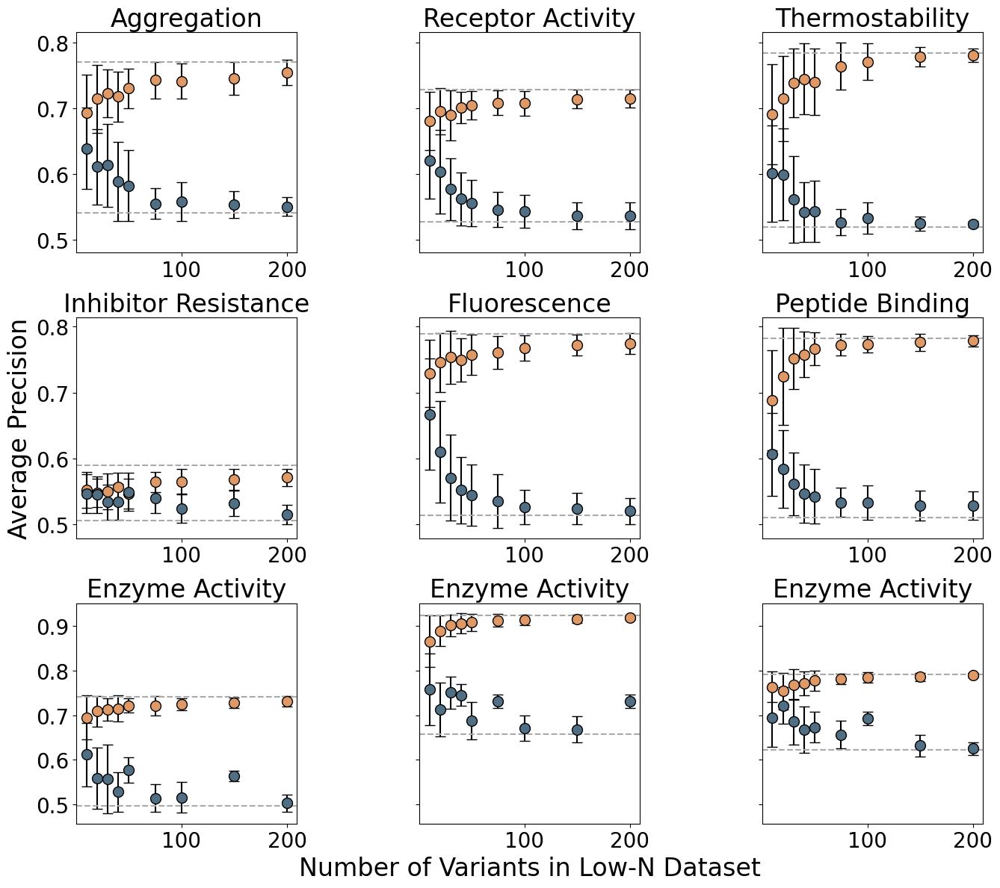

In [17]:
from scipy.stats import ttest_rel
import matplotlib.gridspec as gridspec

#worst_color = '#ffefd3'
worst_color = '#516f84'
#best_color = '#0064a8'
best_color = '#df9966'
jitter_color = "#ADB6C4"
sig_color = "#BB4A12"

neutral_color = "lightgrey"

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15,12), sharey='row')

axes = axes.flatten()
n_selection = [10,20,30,40,50,75,100,150,200]
dataset_names = ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016','SC6A4_HUMAN_Young_2021','YAP1_HUMAN_Araya_2012',
                 "ANCSZ_Hobbs_2022","Q59976_STRSQ_Romero_2015","VKOR1_HUMAN_Chiasson_2020_activity"]
alternative_names = ['Aggregation','Receptor Activity','Thermostability','Inhibitor Resistance',
                                       'Fluorescence','Peptide Binding','Enzyme Activity','Enzyme Activity','Enzyme Activity']
metric = 'average_precision'
np.random.seed(42) # Set seed for reproducibility
# Iterate over the datasets
for ax,name in enumerate(dataset_names):
    ax_top = axes[ax]

    best_ = np.zeros((len(n_selection),iterations))
    worst_ = np.zeros((len(n_selection),iterations))
    significance = []
    d_values = []
    for i,n in enumerate(n_selection):
        suffix = f'_selection_n{n}'
        # Iterate over the iterations
        for ite in range(iterations):
            best_model = zsm_module.best_models_correct[name+suffix][f'ite{ite}']['overall']
            worst_model = zsm_module.worst_models_correct[name+suffix][f'ite{ite}']['overall']
            best_[i,ite] = zsm_module.metric_results[name][(f'{metric}','avg')][best_model]
            worst_[i,ite] = zsm_module.metric_results[name][(f'{metric}','avg')][worst_model]

    # Top plot: best and worst models with error bars
    ax_top.errorbar(n_selection, best_.mean(axis=1), yerr=best_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=best_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)
    ax_top.errorbar(n_selection, worst_.mean(axis=1), yerr=worst_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=worst_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)

    ax_top.axhline(zsm_module.metric_results[name]['average_precision']['avg']
                   [zsm_module.best_models[name]['overall']], color='darkgray', ls='--')
    ax_top.axhline(zsm_module.metric_results[name]['average_precision']['avg']
                   [zsm_module.worst_models[name]['overall']], color='darkgray', ls='--')

    ax_top.set_title(alternative_names[ax], fontsize=24)
    ax_top.tick_params(axis='both', which='major', labelsize=20)
    ax_top.set_box_aspect(1)


axes[7].set_xlabel('Number of Variants in Low-N Dataset', fontsize=24)
#axes[0].set_ylabel('Average Precision', fontsize=24)
axes[3].set_ylabel('Average Precision', fontsize=24)
plt.tight_layout()
plt.show()

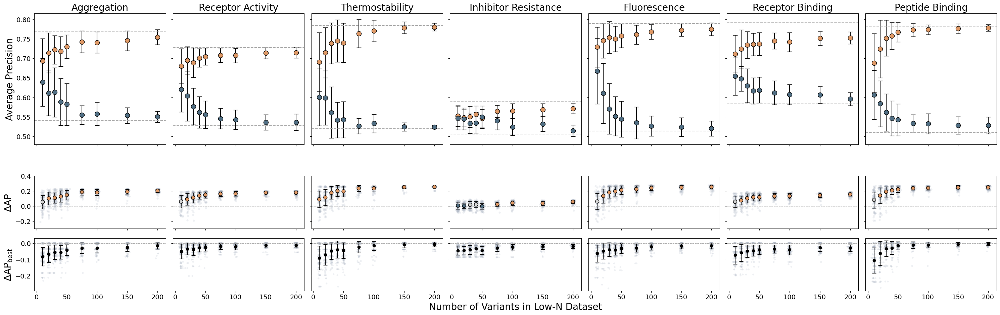

In [10]:
from scipy.stats import ttest_rel
import matplotlib.gridspec as gridspec

#worst_color = '#ffefd3'
worst_color = '#516f84'
#best_color = '#0064a8'
best_color = '#df9966'
jitter_color = "#ADB6C4"
sig_color = "#BB4A12"

neutral_color = "lightgrey"

fig, axes = plt.subplots(nrows=3, ncols=7, figsize=(30,10), sharex='col', sharey='row',
                        gridspec_kw={'height_ratios':[3,1,1]})


n_selection = [10,20,30,40,50,75,100,150,200]
dataset_names = ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016','SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012']
alternative_names = ['Aggregation','Receptor Activity','Thermostability','Inhibitor Resistance',
                                       'Fluorescence','Receptor Binding','Peptide Binding']
metric = 'average_precision'
np.random.seed(42) # Set seed for reproducibility
# Iterate over the datasets
for ax,name in enumerate(dataset_names):
    ax_top = axes[0, ax]
    ax_bottom = axes[1, ax]
    ax_bottom2 = axes[2, ax]

    best_ = np.zeros((len(n_selection),iterations))
    worst_ = np.zeros((len(n_selection),iterations))
    significance = []
    d_values = []
    for i,n in enumerate(n_selection):
        suffix = f'_selection_n{n}'
        # Iterate over the iterations
        for ite in range(iterations):
            best_model = zsm_module.best_models_correct[name+suffix][f'ite{ite}']['overall']
            worst_model = zsm_module.worst_models_correct[name+suffix][f'ite{ite}']['overall']
            best_[i,ite] = zsm_module.metric_results[name][(f'{metric}','avg')][best_model]
            worst_[i,ite] = zsm_module.metric_results[name][(f'{metric}','avg')][worst_model]

        # Calculate the statistical significance between best and worst models and store it
        #significant_, p_val = one_sided_ttest(best_[i], worst_[i])
        t_stat, p_val = ttest_rel(best_[i], worst_[i], alternative='greater')
        significant_ = p_val < 0.05
        significance.append(significant_)

        diff_ = best_[i] - worst_[i]
        d_values.append(cohens_d_paired(best_[i], worst_[i]))
    d_colors = []
    for d in d_values:
        if d < 0.2:
            d_colors.append(worst_color)  # small
        elif d < 0.8:
            d_colors.append(neutral_color)  # medium
        else:
            d_colors.append(best_color)  # large
    # Top plot: best and worst models with error bars
    ax_top.errorbar(n_selection, best_.mean(axis=1), yerr=best_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=best_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)
    ax_top.errorbar(n_selection, worst_.mean(axis=1), yerr=worst_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=worst_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)

    ax_top.axhline(zsm_module.metric_results[name]['average_precision']['avg']
                   [zsm_module.best_models[name]['overall']], color='darkgray', ls='--')
    ax_top.axhline(zsm_module.metric_results[name]['average_precision']['avg']
                   [zsm_module.worst_models[name]['overall']], color='darkgray', ls='--')

    ax_top.set_title(alternative_names[ax], fontsize=20)
    ax_top.tick_params(axis='both', which='major', labelsize=14)
    ax_top.set_box_aspect(1)
    
    # Bottom plot: difference between best and worst models
    diff_ = best_ - worst_
    mean_diff = diff_.mean(axis=1)
    std_diff = diff_.std(axis=1)

    # jittered points
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom.scatter([n + j for j in jitter], diff_[i, :],
                          color=jitter_color, alpha=0.2, s=20, edgecolor='k', lw=0)

    # mean ± std overlay
    ax_bottom.errorbar(
        n_selection, mean_diff, yerr=std_diff, fmt='o', lw=1.2,
        ecolor='k', capsize=4, markersize=0,
        markeredgecolor='k', color='none'
    )
    ax_bottom.scatter(
        n_selection, mean_diff, c=d_colors, s=60, edgecolor='k', zorder=3
    )

    # add 0 line
    ax_bottom.axhline(0, color='darkgray', ls='--', lw=1)

    # optional significance marker
    # for i, sig in enumerate(significance):
    #     if sig:
    #         ax_bottom.text(n_selection[i], std_diff[i] + mean_diff[i] + 0.005,
    #                        '*', color=sig_color, ha='center', fontsize=18)

    ax_bottom.tick_params(axis='both', which='major', labelsize=14)
    ax_bottom.set_box_aspect(0.4)

    # for i, (n, d) in enumerate(zip(n_selection, d_values)):
    #     ax_bottom.text(n,-0.3,#  mean_diff[i] - std_diff[i] - 0.2,
    #                 f"{d:.2f}", ha='center', va='bottom',
    #                 fontsize=9, color='black', alpha=0.8, rotation=90)

    # Compute average precision of the true best model over all variants
    global_best_score = zsm_module.metric_results[name]['average_precision']['avg'][
        zsm_module.best_models[name]['overall']
    ]

    # Compute the difference between selected best and global best for each iteration
    dist_to_global = np.zeros((len(n_selection), iterations))
    for i, n in enumerate(n_selection):
        suffix = f'_selection_n{n}'
        for ite in range(iterations):
            best_model = zsm_module.best_models[name+suffix][f'ite{ite}']['overall']
            dist_to_global[i, ite] = (
                zsm_module.metric_results[name][(metric,'avg')][best_model]
                - global_best_score
            )

    # Jittered points (for iterations)
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom2.scatter(
            [n + j for j in jitter],
            dist_to_global[i, :],
            color=jitter_color, alpha=0.2, s=15, edgecolor='none'
        )

    # Mean ± std bars
    mean_dist = dist_to_global.mean(axis=1)
    std_dist = dist_to_global.std(axis=1)

    ax_bottom2.errorbar(
        n_selection, mean_dist, yerr=std_dist, fmt='o-', lw=0,
        color='black', ecolor='k', elinewidth=1.5, capsize=4
    )

    # Reference line at 0 (perfect selection)
    ax_bottom2.axhline(0, color='darkgray', ls='--', lw=1)
    ax_bottom2.set_box_aspect(0.4)
    ax_bottom2.tick_params(axis='both', which='major', labelsize=14)

for ax_bottom in axes[1, :]:
    ax_bottom.set_ylim(-0.3, 0.4)
axes[2,3].set_xlabel('Number of Variants in Low-N Dataset', fontsize=20)
axes[0,0].set_ylabel('Average Precision', fontsize=20)
axes[1,0].set_ylabel('ΔAP', fontsize=20)
axes[2,0].set_ylabel(r'ΔAP$_{\text{best}}$', fontsize=20)
plt.tight_layout()
plt.subplots_adjust(hspace=0.01)   # a little more if rows look too tight
plt.show()

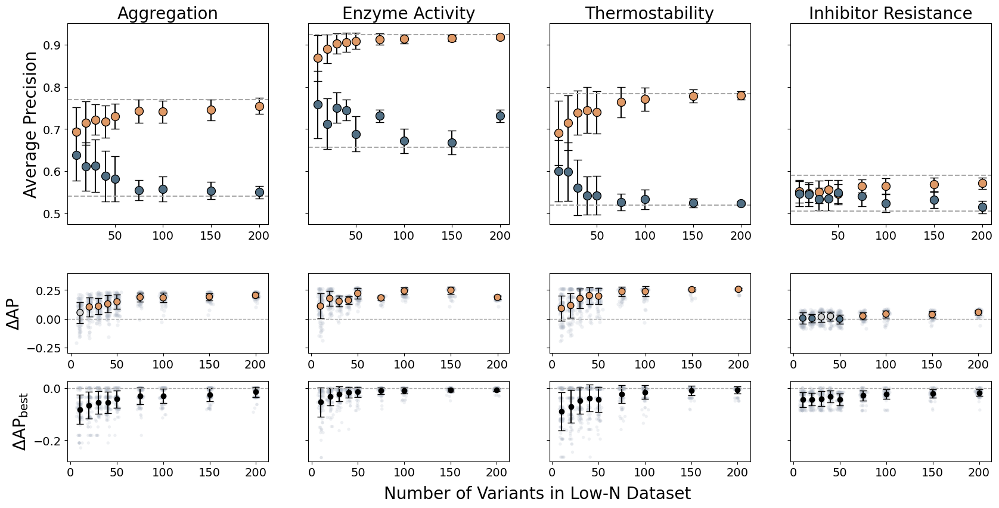

In [19]:
from scipy.stats import ttest_rel
import matplotlib.gridspec as gridspec

#worst_color = '#ffefd3'
worst_color = '#516f84'
#best_color = '#0064a8'
best_color = '#df9966'
jitter_color = "#ADB6C4"
sig_color = "#BB4A12"

neutral_color = "lightgrey"

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20,10), sharey='row',
                        gridspec_kw={'height_ratios':[3,1,1]})


n_selection = [10,20,30,40,50,75,100,150,200]
dataset_names = ['A4_HUMAN_Seuma_2022','Q59976_STRSQ_Romero_2015','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016']
alternative_names = ['Aggregation','Enzyme Activity','Thermostability','Inhibitor Resistance']
metric = 'average_precision'
np.random.seed(42) # Set seed for reproducibility
# Iterate over the datasets
for ax,name in enumerate(dataset_names):
    ax_top = axes[0, ax]
    ax_bottom = axes[1, ax]
    ax_bottom2 = axes[2, ax]

    best_ = np.zeros((len(n_selection),iterations))
    worst_ = np.zeros((len(n_selection),iterations))
    significance = []
    d_values = []
    for i,n in enumerate(n_selection):
        suffix = f'_selection_n{n}'
        # Iterate over the iterations
        for ite in range(iterations):
            best_model = zsm_module.best_models_correct[name+suffix][f'ite{ite}']['overall']
            worst_model = zsm_module.worst_models_correct[name+suffix][f'ite{ite}']['overall']
            best_[i,ite] = zsm_module.metric_results[name][(f'{metric}','avg')][best_model]
            worst_[i,ite] = zsm_module.metric_results[name][(f'{metric}','avg')][worst_model]

        # Calculate the statistical significance between best and worst models and store it
        #significant_, p_val = one_sided_ttest(best_[i], worst_[i])
        t_stat, p_val = ttest_rel(best_[i], worst_[i], alternative='greater')
        significant_ = p_val < 0.05
        significance.append(significant_)

        diff_ = best_[i] - worst_[i]
        d_values.append(cohens_d_paired(best_[i], worst_[i]))
    d_colors = []
    for d in d_values:
        if d < 0.2:
            d_colors.append(worst_color)  # small
        elif d < 0.8:
            d_colors.append(neutral_color)  # medium
        else:
            d_colors.append(best_color)  # large
    # Top plot: best and worst models with error bars
    ax_top.errorbar(n_selection, best_.mean(axis=1), yerr=best_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=best_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)
    ax_top.errorbar(n_selection, worst_.mean(axis=1), yerr=worst_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=worst_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)

    ax_top.axhline(zsm_module.metric_results[name]['average_precision']['avg']
                   [zsm_module.best_models[name]['overall']], color='darkgray', ls='--')
    ax_top.axhline(zsm_module.metric_results[name]['average_precision']['avg']
                   [zsm_module.worst_models[name]['overall']], color='darkgray', ls='--')

    ax_top.set_title(alternative_names[ax], fontsize=20)
    ax_top.tick_params(axis='both', which='major', labelsize=14)
    ax_top.set_box_aspect(1)
    
    # Bottom plot: difference between best and worst models
    diff_ = best_ - worst_
    mean_diff = diff_.mean(axis=1)
    std_diff = diff_.std(axis=1)

    # jittered points
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom.scatter([n + j for j in jitter], diff_[i, :],
                          color=jitter_color, alpha=0.2, s=20, edgecolor='k', lw=0)

    # mean ± std overlay
    ax_bottom.errorbar(
        n_selection, mean_diff, yerr=std_diff, fmt='o', lw=1.2,
        ecolor='k', capsize=4, markersize=0,
        markeredgecolor='k', color='none'
    )
    ax_bottom.scatter(
        n_selection, mean_diff, c=d_colors, s=60, edgecolor='k', zorder=3
    )

    # add 0 line
    ax_bottom.axhline(0, color='darkgray', ls='--', lw=1)

    # optional significance marker
    # for i, sig in enumerate(significance):
    #     if sig:
    #         ax_bottom.text(n_selection[i], std_diff[i] + mean_diff[i] + 0.005,
    #                        '*', color=sig_color, ha='center', fontsize=18)

    ax_bottom.tick_params(axis='both', which='major', labelsize=14)
    ax_bottom.set_box_aspect(0.4)

    # for i, (n, d) in enumerate(zip(n_selection, d_values)):
    #     ax_bottom.text(n,-0.3,#  mean_diff[i] - std_diff[i] - 0.2,
    #                 f"{d:.2f}", ha='center', va='bottom',
    #                 fontsize=9, color='black', alpha=0.8, rotation=90)

    # Compute average precision of the true best model over all variants
    global_best_score = zsm_module.metric_results[name]['average_precision']['avg'][
        zsm_module.best_models[name]['overall']
    ]

    # Compute the difference between selected best and global best for each iteration
    dist_to_global = np.zeros((len(n_selection), iterations))
    for i, n in enumerate(n_selection):
        suffix = f'_selection_n{n}'
        for ite in range(iterations):
            best_model = zsm_module.best_models[name+suffix][f'ite{ite}']['overall']
            dist_to_global[i, ite] = (
                zsm_module.metric_results[name][(metric,'avg')][best_model]
                - global_best_score
            )

    # Jittered points (for iterations)
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom2.scatter(
            [n + j for j in jitter],
            dist_to_global[i, :],
            color=jitter_color, alpha=0.2, s=15, edgecolor='none'
        )

    # Mean ± std bars
    mean_dist = dist_to_global.mean(axis=1)
    std_dist = dist_to_global.std(axis=1)

    ax_bottom2.errorbar(
        n_selection, mean_dist, yerr=std_dist, fmt='o-', lw=0,
        color='black', ecolor='k', elinewidth=1.5, capsize=4
    )

    # Reference line at 0 (perfect selection)
    ax_bottom2.axhline(0, color='darkgray', ls='--', lw=1)
    ax_bottom2.set_box_aspect(0.4)
    ax_bottom2.tick_params(axis='both', which='major', labelsize=14)

for ax_bottom in axes[1, :]:
    ax_bottom.set_ylim(-0.3, 0.4)
axes[2,2].set_xlabel('Number of Variants in Low-N Dataset', fontsize=20)
axes[2,2].xaxis.set_label_coords(-0.06, -0.3)
axes[0,0].set_ylabel('Average Precision', fontsize=20)
axes[1,0].set_ylabel('ΔAP', fontsize=20)
axes[2,0].set_ylabel(r'ΔAP$_{\text{best}}$', fontsize=20)
#plt.tight_layout()
#plt.subplots_adjust(hspace=0.01)   # a little more if rows look too tight
plt.show()

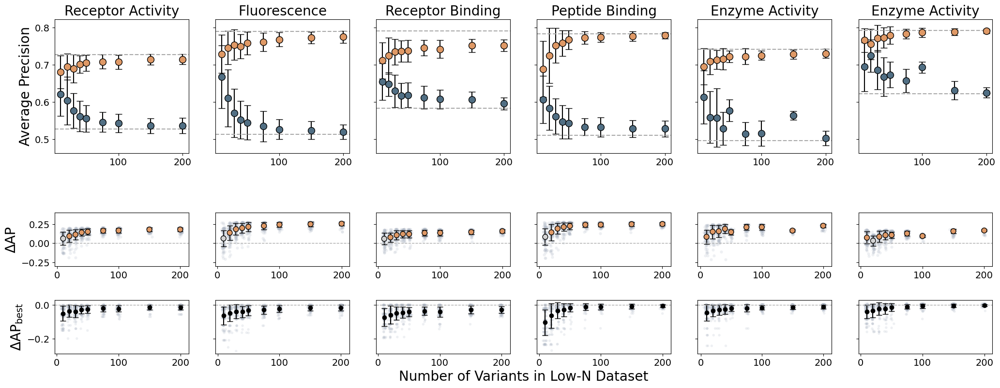

In [20]:
from scipy.stats import ttest_rel
import matplotlib.gridspec as gridspec

#worst_color = '#ffefd3'
worst_color = '#516f84'
#best_color = '#0064a8'
best_color = '#df9966'
jitter_color = "#ADB6C4"
sig_color = "#BB4A12"

neutral_color = "lightgrey"

fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(25,10), sharey='row',
                        gridspec_kw={'height_ratios':[3,1,1]})


n_selection = [10,20,30,40,50,75,100,150,200]
dataset_names = ['ADRB2_HUMAN_Jones_2020','SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
                 "ANCSZ_Hobbs_2022","VKOR1_HUMAN_Chiasson_2020_activity"]
alternative_names = ['Receptor Activity','Fluorescence','Receptor Binding','Peptide Binding','Enzyme Activity','Enzyme Activity']
metric = 'average_precision'
np.random.seed(42) # Set seed for reproducibility
# Iterate over the datasets
for ax,name in enumerate(dataset_names):
    ax_top = axes[0, ax]
    ax_bottom = axes[1, ax]
    ax_bottom2 = axes[2, ax]

    best_ = np.zeros((len(n_selection),iterations))
    worst_ = np.zeros((len(n_selection),iterations))
    significance = []
    d_values = []
    for i,n in enumerate(n_selection):
        suffix = f'_selection_n{n}'
        # Iterate over the iterations
        for ite in range(iterations):
            best_model = zsm_module.best_models_correct[name+suffix][f'ite{ite}']['overall']
            worst_model = zsm_module.worst_models_correct[name+suffix][f'ite{ite}']['overall']
            best_[i,ite] = zsm_module.metric_results[name][(f'{metric}','avg')][best_model]
            worst_[i,ite] = zsm_module.metric_results[name][(f'{metric}','avg')][worst_model]

        # Calculate the statistical significance between best and worst models and store it
        #significant_, p_val = one_sided_ttest(best_[i], worst_[i])
        t_stat, p_val = ttest_rel(best_[i], worst_[i], alternative='greater')
        significant_ = p_val < 0.05
        significance.append(significant_)

        diff_ = best_[i] - worst_[i]
        d_values.append(cohens_d_paired(best_[i], worst_[i]))
    d_colors = []
    for d in d_values:
        if d < 0.2:
            d_colors.append(worst_color)  # small
        elif d < 0.8:
            d_colors.append(neutral_color)  # medium
        else:
            d_colors.append(best_color)  # large
    # Top plot: best and worst models with error bars
    ax_top.errorbar(n_selection, best_.mean(axis=1), yerr=best_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=best_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)
    ax_top.errorbar(n_selection, worst_.mean(axis=1), yerr=worst_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=worst_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)

    ax_top.axhline(zsm_module.metric_results[name]['average_precision']['avg']
                   [zsm_module.best_models[name]['overall']], color='darkgray', ls='--')
    ax_top.axhline(zsm_module.metric_results[name]['average_precision']['avg']
                   [zsm_module.worst_models[name]['overall']], color='darkgray', ls='--')

    ax_top.set_title(alternative_names[ax], fontsize=20)
    ax_top.tick_params(axis='both', which='major', labelsize=14)
    ax_top.set_box_aspect(1)
    
    # Bottom plot: difference between best and worst models
    diff_ = best_ - worst_
    mean_diff = diff_.mean(axis=1)
    std_diff = diff_.std(axis=1)

    # jittered points
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom.scatter([n + j for j in jitter], diff_[i, :],
                          color=jitter_color, alpha=0.2, s=20, edgecolor='k', lw=0)

    # mean ± std overlay
    ax_bottom.errorbar(
        n_selection, mean_diff, yerr=std_diff, fmt='o', lw=1.2,
        ecolor='k', capsize=4, markersize=0,
        markeredgecolor='k', color='none'
    )
    ax_bottom.scatter(
        n_selection, mean_diff, c=d_colors, s=60, edgecolor='k', zorder=3
    )

    # add 0 line
    ax_bottom.axhline(0, color='darkgray', ls='--', lw=1)

    # optional significance marker
    # for i, sig in enumerate(significance):
    #     if sig:
    #         ax_bottom.text(n_selection[i], std_diff[i] + mean_diff[i] + 0.005,
    #                        '*', color=sig_color, ha='center', fontsize=18)

    ax_bottom.tick_params(axis='both', which='major', labelsize=14)
    ax_bottom.set_box_aspect(0.4)

    # for i, (n, d) in enumerate(zip(n_selection, d_values)):
    #     ax_bottom.text(n,-0.3,#  mean_diff[i] - std_diff[i] - 0.2,
    #                 f"{d:.2f}", ha='center', va='bottom',
    #                 fontsize=9, color='black', alpha=0.8, rotation=90)

    # Compute average precision of the true best model over all variants
    global_best_score = zsm_module.metric_results[name]['average_precision']['avg'][
        zsm_module.best_models[name]['overall']
    ]

    # Compute the difference between selected best and global best for each iteration
    dist_to_global = np.zeros((len(n_selection), iterations))
    for i, n in enumerate(n_selection):
        suffix = f'_selection_n{n}'
        for ite in range(iterations):
            best_model = zsm_module.best_models[name+suffix][f'ite{ite}']['overall']
            dist_to_global[i, ite] = (
                zsm_module.metric_results[name][(metric,'avg')][best_model]
                - global_best_score
            )

    # Jittered points (for iterations)
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom2.scatter(
            [n + j for j in jitter],
            dist_to_global[i, :],
            color=jitter_color, alpha=0.2, s=15, edgecolor='none'
        )

    # Mean ± std bars
    mean_dist = dist_to_global.mean(axis=1)
    std_dist = dist_to_global.std(axis=1)

    ax_bottom2.errorbar(
        n_selection, mean_dist, yerr=std_dist, fmt='o-', lw=0,
        color='black', ecolor='k', elinewidth=1.5, capsize=4
    )

    # Reference line at 0 (perfect selection)
    ax_bottom2.axhline(0, color='darkgray', ls='--', lw=1)
    ax_bottom2.set_box_aspect(0.4)
    ax_bottom2.tick_params(axis='both', which='major', labelsize=14)

for ax_bottom in axes[1, :]:
    ax_bottom.set_ylim(-0.3, 0.4)
axes[2,2].set_xlabel('Number of Variants in Low-N Dataset', fontsize=20)
axes[2,2].xaxis.set_label_coords(1.1, -0.3)
axes[0,0].set_ylabel('Average Precision', fontsize=20)
axes[1,0].set_ylabel('ΔAP', fontsize=20)
axes[2,0].set_ylabel(r'ΔAP$_{\text{best}}$', fontsize=20)
#plt.tight_layout()
#plt.subplots_adjust(hspace=0.01)   # a little more if rows look too tight
plt.show()

## Model Sizes

In [9]:
model_sizes = {'ESM2_8M':8,
                'ESM2_35M':35,
                'ESM2_150M':150,
                'ESM2_650M':650,
                'ESM2_3B':3000,
                'Tranception_S':85,
                'Tranception_M':300,
                'Tranception_L':700,
                'TranceptionNoRet_S':85,
                'TranceptionNoRet_M':300,
                'TranceptionNoRet_L':700,
                'TranceptEVE_S':85,
                'TranceptEVE_M':300,
                'TranceptEVE_L':700,
                'Progen2_small':151,
                'Progen2_medium':764,
                'Progen2_base':764,
                'Progen2_large':2700,
                'RITA_small':85,
                'RITA_medium':300,
                'RITA_large':680,
                'RITA_xlarge':1200,
                'CARP_600K':0.6,
                'CARP_38M':38,
                'CARP_76M':76,
                'CARP_640M':640,
               }

model_colors = {
    "ESM2_": "#003052",
    "Tranception_": "#516F84",
    "TranceptionNoRet_": "#ADB6C4",
    "TranceptEVE_": "#FFEFD3",
    "Progen2_": "#ECBB8C",
    "RITA_": "#E79052",
    "CARP_": "#B75B33"
}


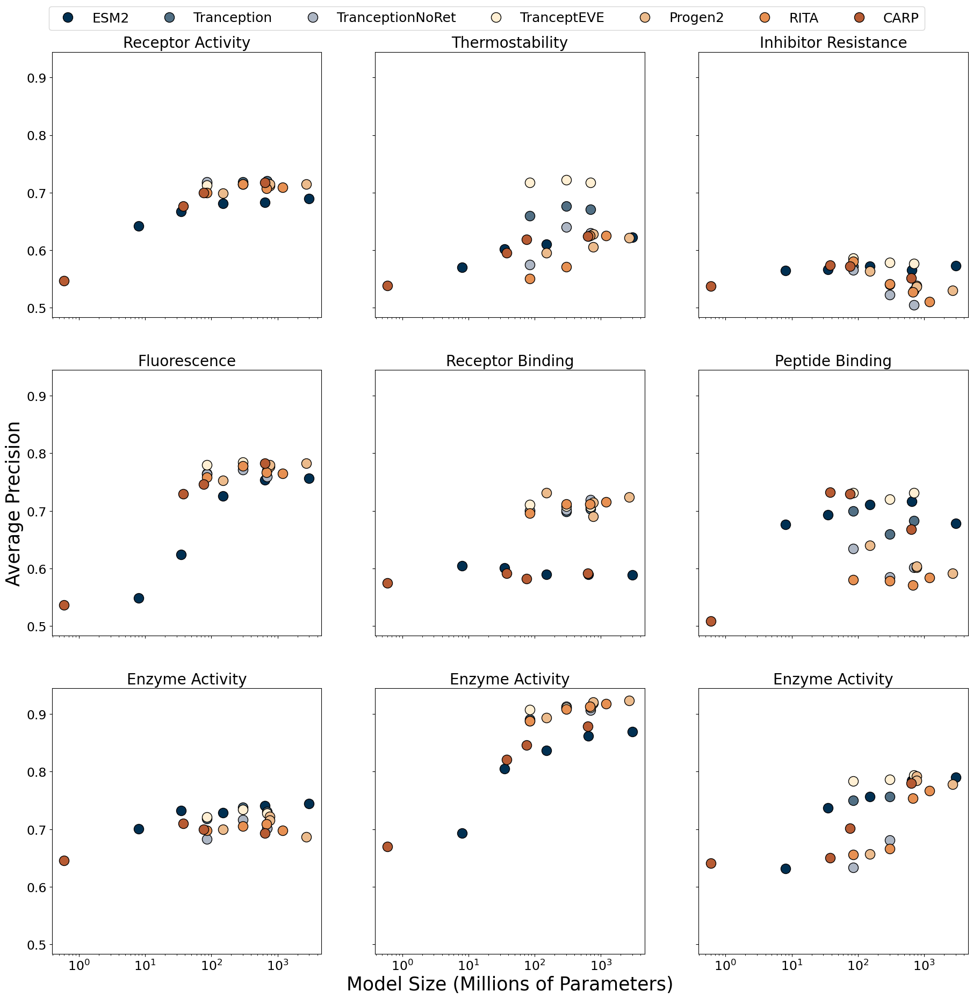

In [13]:
import matplotlib.pyplot as plt
import numpy as np

datasets= ['ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016','SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
                 "ANCSZ_Hobbs_2022","Q59976_STRSQ_Romero_2015","VKOR1_HUMAN_Chiasson_2020_activity"]
alternative_names = ['Receptor Activity','Thermostability','Inhibitor Resistance',
                                       'Fluorescence','Receptor Binding','Peptide Binding','Enzyme Activity','Enzyme Activity','Enzyme Activity']
models = [
    'ESM2_','Tranception_','TranceptionNoRet_','TranceptEVE_','Progen2_','RITA_','CARP_'
]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']

# --- Create grid of subplots (e.g. 2x4) ---
n_rows, n_cols = 3, 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 20), sharex=True, sharey=True)
axes = axes.flatten()

for d, (dataset, ax) in enumerate(zip(datasets, axes)):
    for i, model in enumerate(models):
        sizes, ap_scores = [], []

        for m in model_sizes.keys():
            if m.startswith(model):
                sizes.append(model_sizes[m])
                ap_scores.append(zsm_module.metric_results[dataset][('average_precision', 'avg')][m])

        if sizes:  # skip if no data for that model
            sizes = np.array(sizes)
            ap_scores = np.array(ap_scores)
            ax.plot(
                sizes, ap_scores,ls='',
                marker='o', label=model[:-1],
                color=model_colors[model], markeredgecolor='k', ms=13
            )

    ax.set_xscale('log')
    ax.set_title(alternative_names[d], fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=17)

axes[7].set_xlabel('Model Size (Millions of Parameters)', fontsize=25)
#axes[6].xaxis.set_label_coords(-0.05, -0.2)

axes[3].set_ylabel('Average Precision', fontsize=25)
#axes[3].yaxis.set_label_coords(-0.13,-0.05)

# --- Shared labels ---
#fig.text(0.5, 0.04, 'Model Size (Millions of Parameters)', ha='center', fontsize=18)
#fig.text(0.04, 0.5, 'Average Precision', va='center', rotation='vertical', fontsize=18)

# --- Legend (only once) ---
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=len(models), fontsize=18)

# Move figure legend slightly down
fig.subplots_adjust(top=0.95)

# Remove empty subplot if number of datasets < n_rows * n_cols
if len(datasets) < len(axes):
    for j in range(len(datasets), len(axes)):
        fig.delaxes(axes[j])

#fig.tight_layout(rect=[0.03, 0.05, 1, 0.93])
#plt.tight_layout()
plt.show()


In [24]:
color_dict = {}
for model in zsm_module.config['models']:
    if model['name']+'_' in ['ESM2_','Tranception_','TranceptionNoRet_','TranceptEVE_','Progen2_','RITA_','CARP_']:
        color_dict[model['name']+'_'] = model['color']

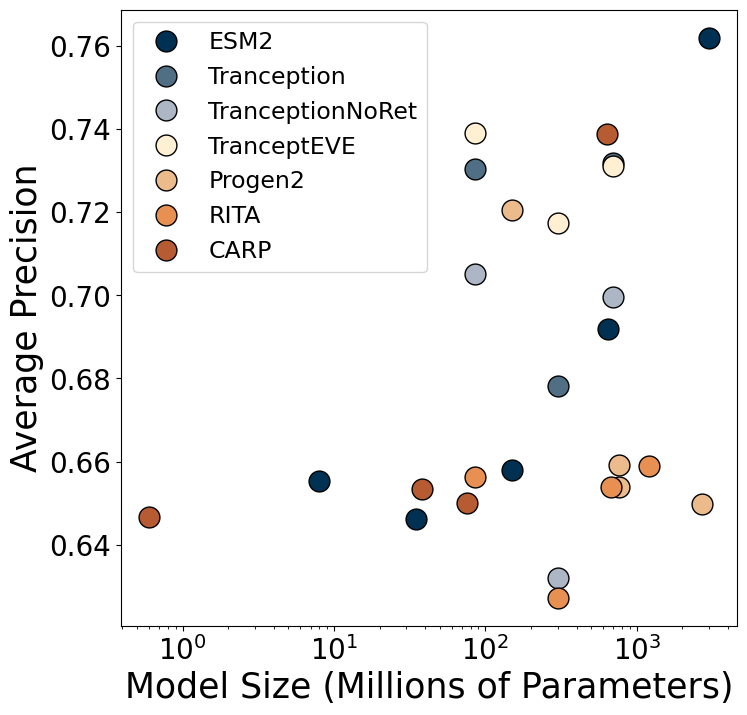

In [12]:
alternative_names = ['Aggregation']
metric = 'average_precision'
for d, dataset in enumerate(['A4_HUMAN_Seuma_2022']):
    fig,ax = plt.subplots(figsize=(8,8))
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
    for i, model in enumerate(['ESM2_','Tranception_','TranceptionNoRet_','TranceptEVE_','Progen2_','RITA_','CARP_']):
        sizes = []
        ap_scores = []
        ap_scores_ite = []
        for m in model_sizes.keys():
            if m.startswith(model):

                sizes.append(model_sizes[m])
                ap_scores.append(zsm_module.metric_results[dataset][('average_precision','avg')][m])
        sizes = np.array(sizes)
        ap_scores = np.array(ap_scores)
        plt.plot(sizes,ap_scores,marker='o',label=model[:-1],color=model_colors[model],markeredgecolor='k',ms=15,ls='')
    ax.set_box_aspect(1)
    plt.xscale('log')
    plt.xlabel('Model Size (Millions of Parameters)', fontsize=25)
    plt.ylabel('Average Precision', fontsize=25)
    #plt.title(f'{alternative_names[d]}', fontsize=25)
    plt.legend(fontsize=17)
    plt.tick_params(axis='both', which='major', labelsize=20)

## Model Heatmap

In [26]:
n_models = len(model_list)
n_selection = [10,20,30,40,50,75,100,150,200]

mat_dict = {}
dataset_names = ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016','SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
                 "ANCSZ_Hobbs_2022","Q59976_STRSQ_Romero_2015","VKOR1_HUMAN_Chiasson_2020_activity"]

for name, dataset_name in enumerate(dataset_names):
    best_model_mat = np.zeros((9,len(model_list)))
    worst_model_mat = np.zeros((9,len(model_list)))
    
    for n, lowN in enumerate(n_selection):
        lowN_name = f'{dataset_name}_selection_n{lowN}'
        for i, model in enumerate(model_list):
            for ite in range(iterations):
                best_ = zsm_module.best_models_correct[lowN_name][f'ite{ite}']['overall']
                worst_ = zsm_module.worst_models[lowN_name][f'ite{ite}']['overall']
                if model == 'Trancept_no_ret':
                    if 'Tranception_no_ret' in best_:
                        best_model_mat[n][i] += 1
                    if 'Tranception_no_ret' in worst_:
                        worst_model_mat[n][i] += 1
                else:
                    if model in best_:
                        best_model_mat[n][i] += 1
                    if model in worst_:
                        worst_model_mat[n][i] += 1
    mat_dict[dataset_name] = (best_model_mat,worst_model_mat)

In [27]:
# Best Overall Models
best_models = []
for dataset_name in ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                        'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
                        'ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']:
    best_models.append(zsm_module.best_models_correct[dataset_name]['overall'])
best_idx = [model_list.index(m.split('_')[0]) for m in best_models]
best_idx_dict = {dataset_name:model_list.index(zsm_module.best_models_correct[dataset_name]['overall'].split('_')[0]) for dataset_name in ['ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                                               'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
                                               'ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']}

In [28]:
# Worst Overall Models
worst_models = []
for dataset_name in ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                        'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
                        'ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']:
    worst_models.append(zsm_module.worst_models[dataset_name]['overall'])
worst_idx = [model_list.index(m.split('_')[0]) for m in worst_models]
worst_idx_dict = {dataset_name:model_list.index(zsm_module.worst_models[dataset_name]['overall'].split('_')[0]) for dataset_name in ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                                               'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
                                               'ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']}

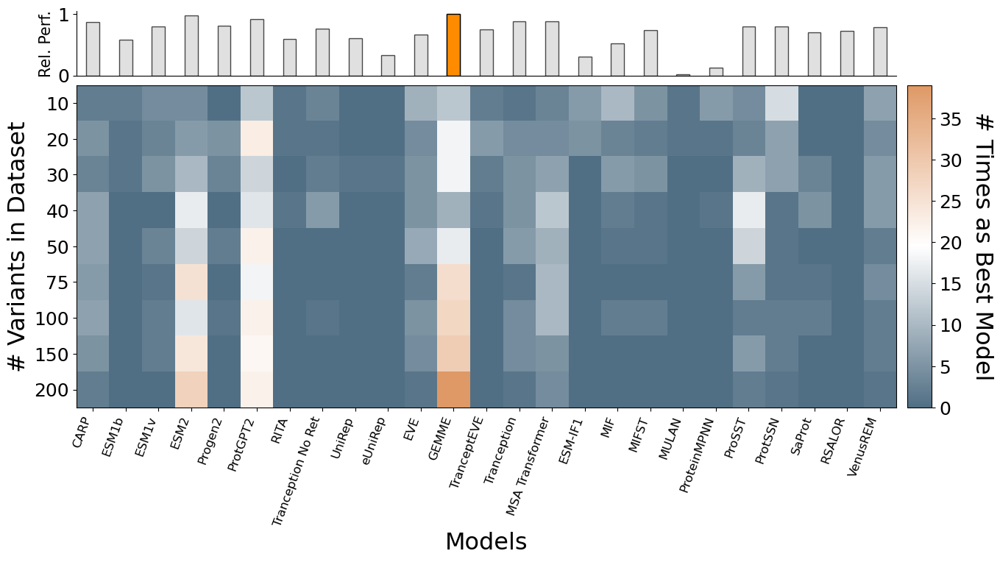

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

dataset = 'A4_HUMAN_Seuma_2022'
best_mat_ = mat_dict[dataset][0]

relative_performance = (
    zsm_module.combined_metric[dataset].values /
    zsm_module.combined_metric[dataset].max()
)

n_models = len(relative_performance)
bar_positions = np.arange(n_models)

fig = plt.figure(figsize=(15, 7))
gs = fig.add_gridspec(nrows=2, ncols=1, height_ratios=[0.6, 3], hspace=0.05)


ax_top = fig.add_subplot(gs[0])

# Add relative performance bars
ax_top.bar(
    x=bar_positions,
    height=relative_performance,
    color='lightgray',
    edgecolor='black',
    width=0.4,
    alpha=0.7
)

# Highlight best model
best_idx = np.argmax(relative_performance)
ax_top.bar(
    x=best_idx,
    height=relative_performance[best_idx],
    color='darkorange',
    edgecolor='black',
    width=0.4,
    alpha=1
)
# # Vertical lines
# ax_top.vlines(
#     x=bar_positions,
#     ymin=0,
#     ymax=relative_performance,
#     color='black',
#     linewidth=1.4
# )

# # Caps (T-tops)
# cap_width = 0.4
# ax_top.hlines(
#     y=relative_performance,
#     xmin=bar_positions - cap_width / 2,
#     xmax=bar_positions + cap_width / 2,
#     color='black',
#     linewidth=1.4
# )

# # Highlight best model
# best_idx = np.argmax(relative_performance)
# ax_top.vlines(best_idx, 0, relative_performance[best_idx], color='darkorange', linewidth=2)
# ax_top.hlines(relative_performance[best_idx],
#               best_idx - cap_width / 2,
#               best_idx + cap_width / 2,
#               color='darkorange', linewidth=2)

# Formatting
ax_top.set_ylim(0, 1.05)
ax_top.set_xlim(-0.5, n_models - 0.5)
ax_top.set_ylabel('Rel. Perf.', fontsize=15)
ax_top.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)  # removes all x ticks/labels
ax_top.tick_params(labelsize=18)
ax_top.spines[['top', 'right']].set_visible(False)

divider = make_axes_locatable(ax_top)
cax = divider.append_axes("right", size="3%", pad=0.15)
cax.axis('off')  # Hide colorbar axis for the top plot


ax_bottom = fig.add_subplot(gs[1], sharex=ax_top)

im = ax_bottom.imshow(best_mat_, cmap=cmap, aspect='auto', interpolation='nearest', origin='upper')

# Tick positions
ax_bottom.set_xticks(bar_positions)
ax_bottom.set_xticklabels([
    'CARP','ESM1b','ESM1v','ESM2','Progen2','ProtGPT2','RITA','Tranception No Ret','UniRep',
    'eUniRep','EVE','GEMME','TranceptEVE','Tranception','MSA Transformer',
    'ESM-IF1','MIF','MIFST','MULAN','ProteinMPNN','ProSST','ProtSSN','SaProt',
    'RSALOR','VenusREM'
], rotation=70, fontsize=12, ha='right')

ax_bottom.set_yticks(range(len(n_selection)))
ax_bottom.set_yticklabels([f'{n}' for n in n_selection], fontsize=18)

ax_bottom.set_ylabel('# Variants in Dataset', fontsize=23)
ax_bottom.set_xlabel('Models', fontsize=23)

# Colorbar
divider = make_axes_locatable(ax_bottom)
cax = divider.append_axes("right", size="3%", pad=0.15)
cbar = plt.colorbar(im, cax=cax)
cbar.ax.tick_params(labelsize=18)
cbar.set_label('# Times as Best Model', fontsize=23, rotation=270, labelpad=30)

#plt.tight_layout()
plt.show()


Dataset Name: A4_HUMAN_Seuma_2022, Alternative Name: Aggregation


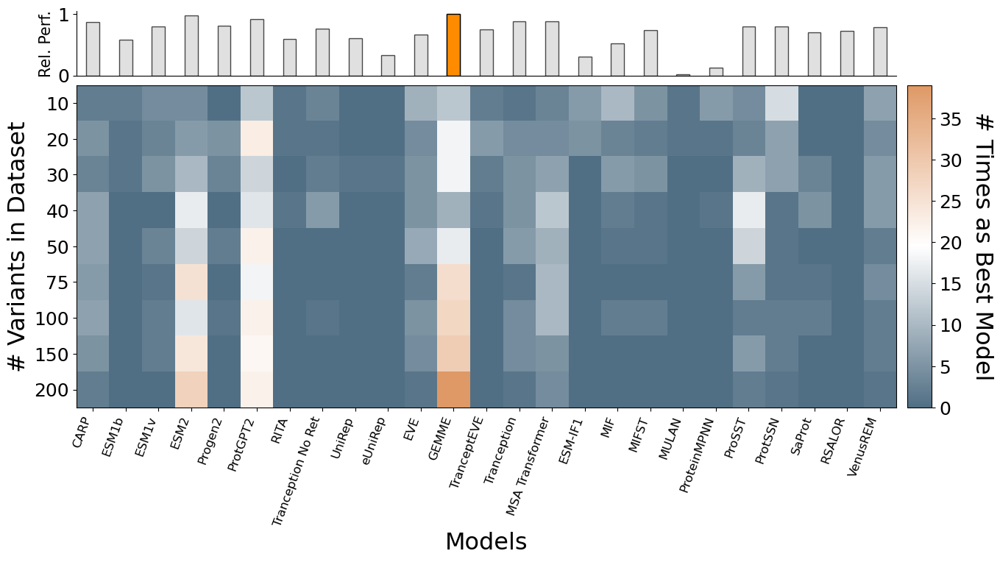

Dataset Name: ADRB2_HUMAN_Jones_2020, Alternative Name: Receptor Activity


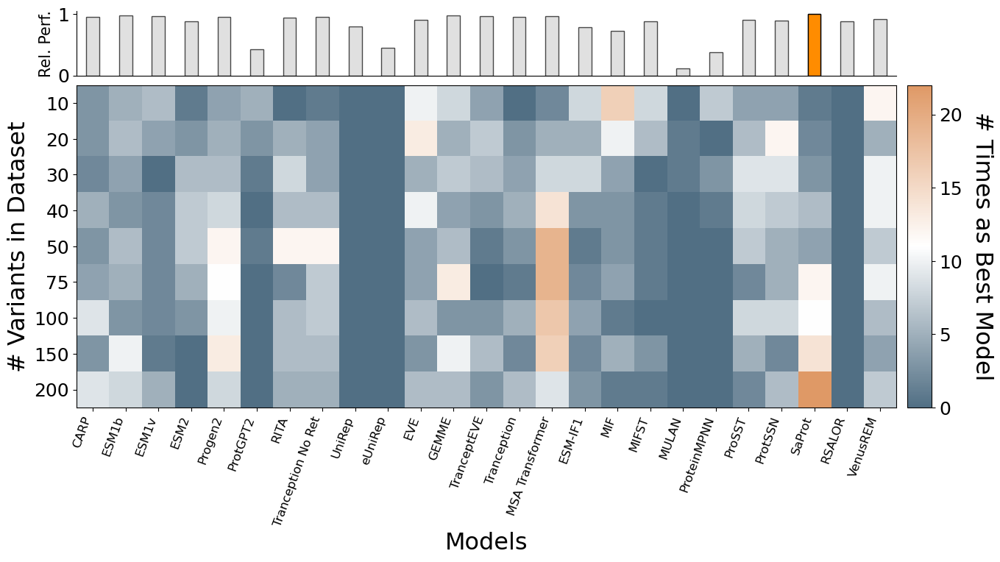

Dataset Name: ESTA_BACSU_Nutschel_2020, Alternative Name: Thermostability


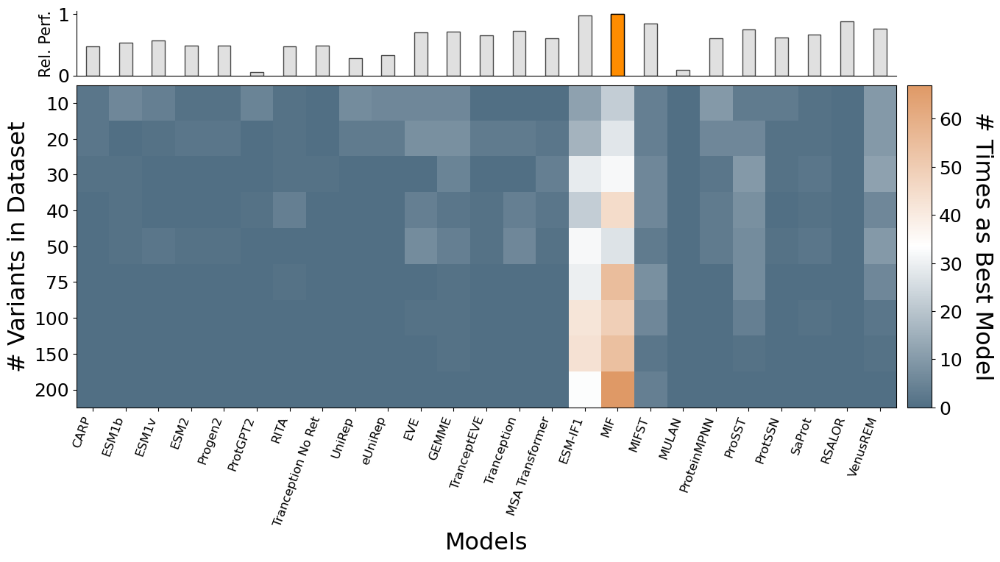

Dataset Name: MK01_HUMAN_Brenan_2016, Alternative Name: Inhibitor Resistance


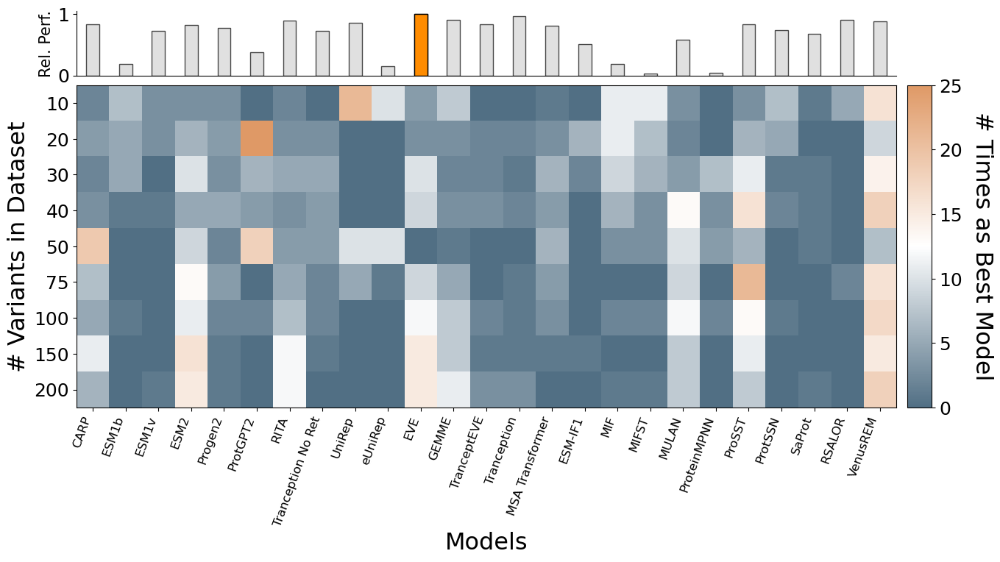

Dataset Name: SC6A4_HUMAN_Young_2021, Alternative Name: Fluorescence


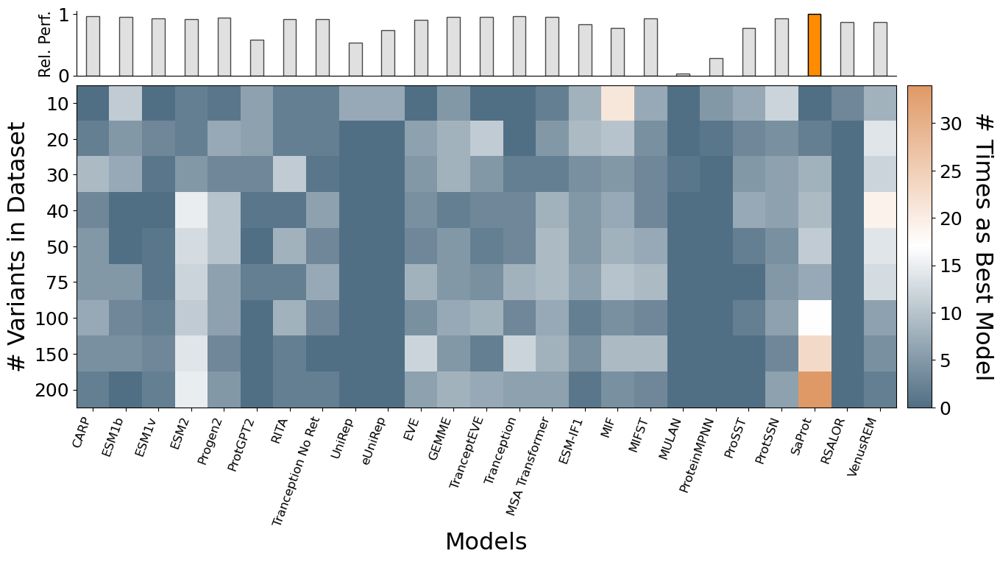

Dataset Name: SPIKE_SARS2_Starr_2020_binding, Alternative Name: Receptor Binding


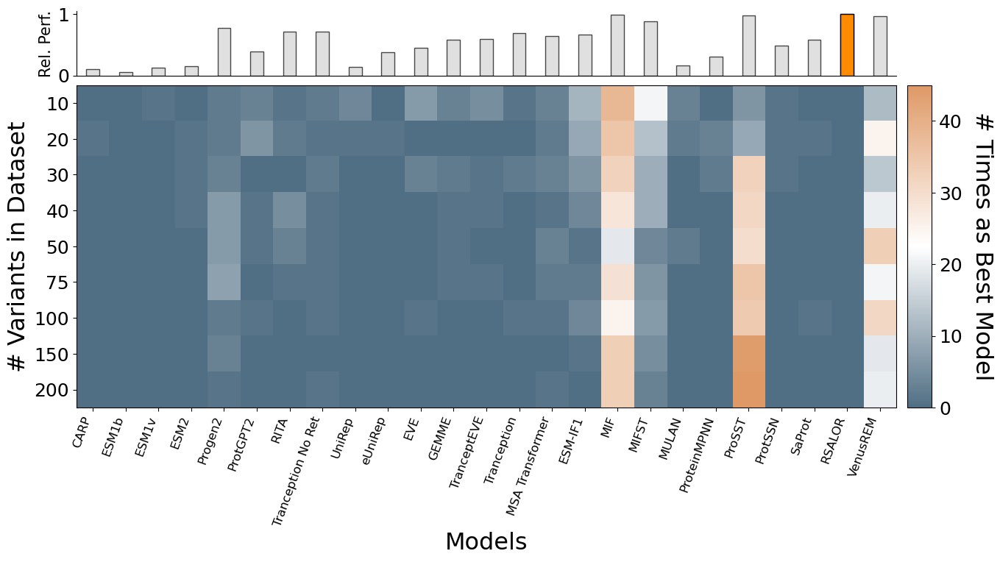

Dataset Name: YAP1_HUMAN_Araya_2012, Alternative Name: Peptide Binding


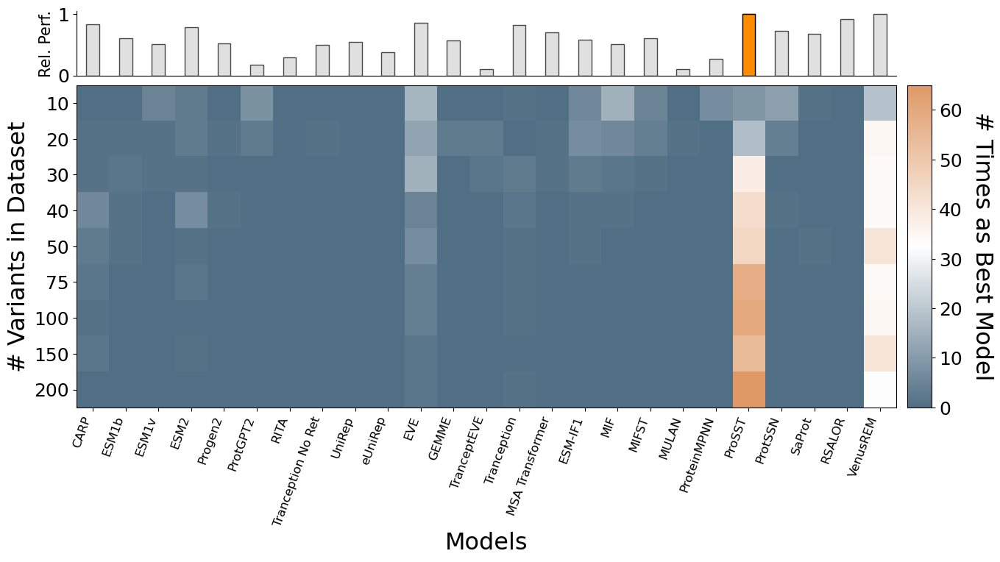

Dataset Name: ANCSZ_Hobbs_2022, Alternative Name: Enzyme Activity


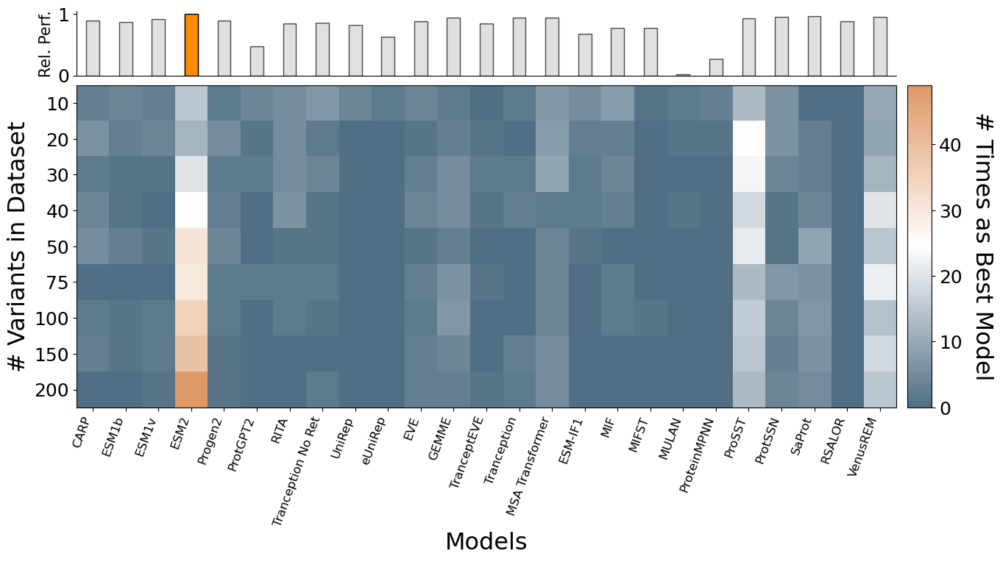

Dataset Name: Q59976_STRSQ_Romero_2015, Alternative Name: Enzyme Activity


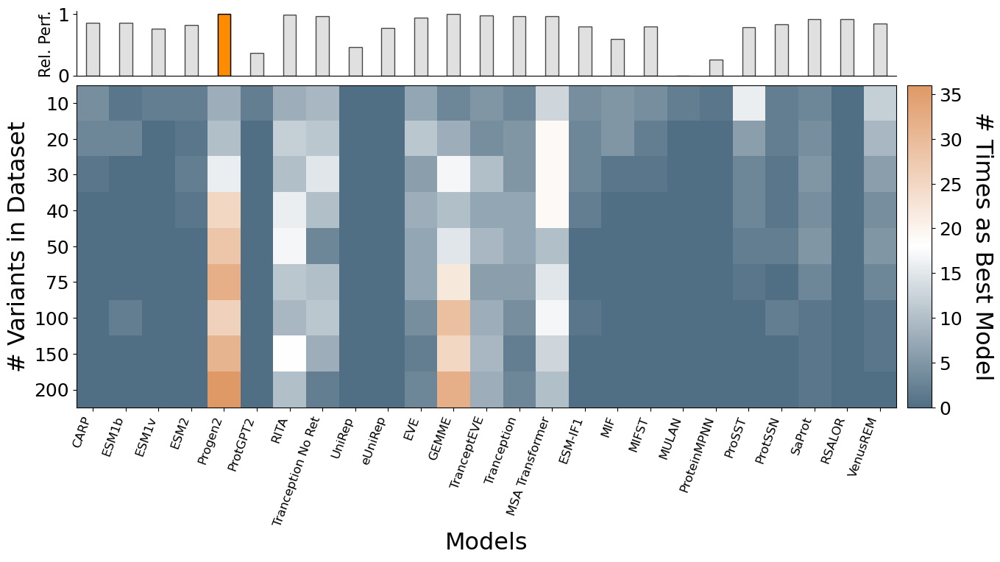

Dataset Name: VKOR1_HUMAN_Chiasson_2020_activity, Alternative Name: Enzyme Activity


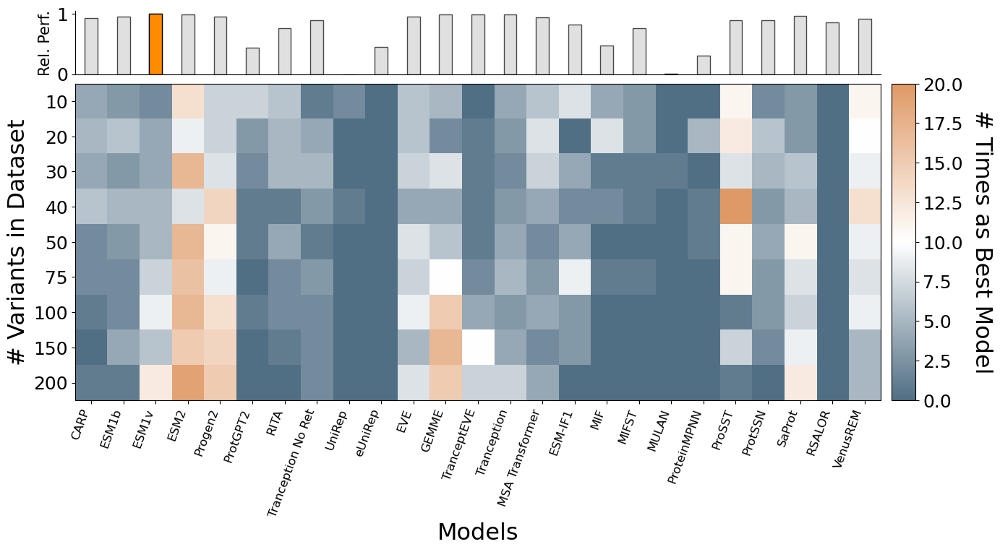

In [30]:

for dataset,alternative_name in zip(['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016','SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
                                       "ANCSZ_Hobbs_2022","Q59976_STRSQ_Romero_2015","VKOR1_HUMAN_Chiasson_2020_activity"],
                                     ['Aggregation','Receptor Activity','Thermostability','Inhibitor Resistance',
                                       'Fluorescence','Receptor Binding','Peptide Binding',
                                       'Enzyme Activity','Enzyme Activity','Enzyme Activity']):
    print(f'Dataset Name: {dataset}, Alternative Name: {alternative_name}')
    best_mat_ = mat_dict[dataset][0]
    if len(zsm_module.combined_metric[dataset].values) > 25:
        best_var_ = zsm_module.best_variants[dataset]
        comb_met_ = zsm_module.combined_metric[dataset].loc[best_var_]
        relative_performance = (
        comb_met_.values /
        comb_met_.max()
        )
    else:
        relative_performance = (
            zsm_module.combined_metric[dataset].values /
            zsm_module.combined_metric[dataset].max()
        )

    n_models = len(relative_performance)
    bar_positions = np.arange(n_models)

    fig = plt.figure(figsize=(15, 7))
    gs = fig.add_gridspec(nrows=2, ncols=1, height_ratios=[0.6, 3], hspace=0.05)


    ax_top = fig.add_subplot(gs[0])

    # Add relative performance bars
    ax_top.bar(
        x=bar_positions,
        height=relative_performance,
        color='lightgray',
        edgecolor='black',
        width=0.4,
        alpha=0.7
    )

    # Highlight best model
    best_idx = np.argmax(relative_performance)
    ax_top.bar(
        x=best_idx,
        height=relative_performance[best_idx],
        color='darkorange',
        edgecolor='black',
        width=0.4,
        alpha=1
    )
    # # Vertical lines
    # ax_top.vlines(
    #     x=bar_positions,
    #     ymin=0,
    #     ymax=relative_performance,
    #     color='black',
    #     linewidth=1.4
    # )

    # # Caps (T-tops)
    # cap_width = 0.4
    # ax_top.hlines(
    #     y=relative_performance,
    #     xmin=bar_positions - cap_width / 2,
    #     xmax=bar_positions + cap_width / 2,
    #     color='black',
    #     linewidth=1.4
    # )

    # # Highlight best model
    # best_idx = np.argmax(relative_performance)
    # ax_top.vlines(best_idx, 0, relative_performance[best_idx], color='darkorange', linewidth=2)
    # ax_top.hlines(relative_performance[best_idx],
    #               best_idx - cap_width / 2,
    #               best_idx + cap_width / 2,
    #               color='darkorange', linewidth=2)

    # Formatting
    ax_top.set_ylim(0, 1.05)
    ax_top.set_xlim(-0.5, n_models - 0.5)
    ax_top.set_ylabel('Rel. Perf.', fontsize=15)
    ax_top.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)  # removes all x ticks/labels
    ax_top.tick_params(labelsize=18)
    ax_top.spines[['top', 'right']].set_visible(False)

    divider = make_axes_locatable(ax_top)
    cax = divider.append_axes("right", size="3%", pad=0.15)
    cax.axis('off')  # Hide colorbar axis for the top plot


    ax_bottom = fig.add_subplot(gs[1], sharex=ax_top)

    im = ax_bottom.imshow(best_mat_, cmap=cmap, aspect='auto', interpolation='nearest', origin='upper')

    # Tick positions
    ax_bottom.set_xticks(bar_positions)
    ax_bottom.set_xticklabels([
        'CARP','ESM1b','ESM1v','ESM2','Progen2','ProtGPT2','RITA','Tranception No Ret','UniRep',
        'eUniRep','EVE','GEMME','TranceptEVE','Tranception','MSA Transformer',
        'ESM-IF1','MIF','MIFST','MULAN','ProteinMPNN','ProSST','ProtSSN','SaProt',
        'RSALOR','VenusREM'
    ], rotation=70, fontsize=12, ha='right')

    ax_bottom.set_yticks(range(len(n_selection)))
    ax_bottom.set_yticklabels([f'{n}' for n in n_selection], fontsize=18)

    ax_bottom.set_ylabel('# Variants in Dataset', fontsize=23)
    ax_bottom.set_xlabel('Models', fontsize=23)

    # Colorbar
    divider = make_axes_locatable(ax_bottom)
    cax = divider.append_axes("right", size="3%", pad=0.15)
    cbar = plt.colorbar(im, cax=cax)
    cbar.ax.tick_params(labelsize=18)
    cbar.set_label('# Times as Best Model', fontsize=23, rotation=270, labelpad=30)

    #plt.tight_layout()
    plt.show()


## Single vs. Multiple Mutations

In [71]:
for prot in ['A4_HUMAN_Seuma_2022','YAP1_HUMAN_Araya_2012']:
    exp_ = zsm_module.datasets[prot]['exp_data']
    exp_ = exp_[exp_['mutant'].str.contains('WT')==False]
    
    zsm_module.set_threshold(f'{prot}_single',zsm_module.threshold[prot])
    zsm_module.model_list[f'{prot}_single'] = zsm_module.model_list[prot]
    zsm_module.name_list[f'{prot}_single'] = zsm_module.name_list[prot]
    zsm_module.datasets[f'{prot}_single'] = {}


    single_mutants = exp_.mutant.str.count(':')==0

    exp_single = exp_[single_mutants]

    zsm_module.datasets[f'{prot}_single']['exp_data'] = exp_single


    for n in [10,20,30,40,50,75,100,150,200]:

        zsm_module.set_threshold(f'{prot}_single_selection_n{n}',zsm_module.threshold[prot])
        zsm_module.model_list[f'{prot}_single_selection_n{n}'] = zsm_module.model_list[prot]
        zsm_module.name_list[f'{prot}_single_selection_n{n}'] = zsm_module.name_list[prot]
        zsm_module.datasets[f'{prot}_single_selection_n{n}'] = {}

        np.random.seed(42)
        mutants_sel = resample(exp_single.index,n_samples=n,replace=False).tolist()
        for i in range(iterations-1):
            mut_ = resample(exp_single.index,n_samples=n,replace=False).tolist()
            if exp_single.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_single.loc[mut_]["DMS_score_bin"].mean() == 1:
                print(f'WARNING: ALL SAME CLASS FOR {prot} with n={n} in iteration {i}, RESAMPLING')
                while exp_single.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_single.loc[mut_]["DMS_score_bin"].mean() == 1:
                    mut_ = resample(exp_single.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
            mutants_sel += mut_

        exp_sel = exp_single.loc[mutants_sel].reset_index()
        zsm_module.datasets[f'{prot}_single_selection_n{n}']['exp_data'] = exp_sel.drop(columns='index')
        for model in zsm_module.name_list[prot]:
            data_ = zsm_module.datasets[prot][model].copy()
            if n == 10:
                zsm_module.datasets[f'{prot}_single'][model] = data_[single_mutants]
            data_sel = data_.loc[mutants_sel].reset_index()
            zsm_module.datasets[f'{prot}_single_selection_n{n}'][model] = data_sel.drop(columns='index')

In [72]:
for prot in ['A4_HUMAN_Seuma_2022','YAP1_HUMAN_Araya_2012']:
    exp_ = zsm_module.datasets[prot]['exp_data']
    exp_ = exp_[exp_['mutant'].str.contains('WT')==False]
    
    zsm_module.set_threshold(f'{prot}_multi',zsm_module.threshold[prot])
    zsm_module.model_list[f'{prot}_multi'] = zsm_module.model_list[prot]
    zsm_module.name_list[f'{prot}_multi'] = zsm_module.name_list[prot]
    zsm_module.datasets[f'{prot}_multi'] = {}


    multi_mutants = exp_.mutant.str.count(':')!=0

    exp_multi = exp_[multi_mutants]

    zsm_module.datasets[f'{prot}_multi']['exp_data'] = exp_multi


    for n in [10,20,30,40,50,75,100,150,200]:

        zsm_module.set_threshold(f'{prot}_multi_selection_n{n}',zsm_module.threshold[prot])
        zsm_module.model_list[f'{prot}_multi_selection_n{n}'] = zsm_module.model_list[prot]
        zsm_module.name_list[f'{prot}_multi_selection_n{n}'] = zsm_module.name_list[prot]
        zsm_module.datasets[f'{prot}_multi_selection_n{n}'] = {}

        np.random.seed(42)
        mutants_sel = resample(exp_multi.index,n_samples=n,replace=False).tolist()
        for i in range(iterations-1):
            mut_ = resample(exp_multi.index,n_samples=n,replace=False).tolist()
            if exp_multi.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_multi.loc[mut_]["DMS_score_bin"].mean() == 1:
                print(f'WARNING: ALL SAME CLASS FOR {prot} with n={n} in iteration {i}, RESAMPLING')
                while exp_multi.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_multi.loc[mut_]["DMS_score_bin"].mean() == 1:
                    mut_ = resample(exp_multi.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
            mutants_sel += mut_

        exp_sel = exp_multi.loc[mutants_sel].reset_index()
        zsm_module.datasets[f'{prot}_multi_selection_n{n}']['exp_data'] = exp_sel.drop(columns='index')
        for model in zsm_module.name_list[prot]:
            data_ = zsm_module.datasets[prot][model].copy()
            if n == 10:
                zsm_module.datasets[f'{prot}_multi'][model] = data_[multi_mutants]
            data_sel = data_.loc[mutants_sel].reset_index()
            zsm_module.datasets[f'{prot}_multi_selection_n{n}'][model] = data_sel.drop(columns='index')

In [73]:
for prot in ['A4_HUMAN_Seuma_2022_single','YAP1_HUMAN_Araya_2012_single','A4_HUMAN_Seuma_2022_multi','YAP1_HUMAN_Araya_2012_multi']:
    for n in [10,20,30,40,50,75,100,150,200]:
        zsm_module.compute_metrics_iterations(f'{prot}_selection_n{n}',n_bootstrap=n_bootstrap,ite_size=n,metrics=['spearmanr','average_precision'],iterations=iterations)
        zsm_module.process_models_iteration(f'{prot}_selection_n{n}',iterations=iterations,ite_size=n)

/Users/dahala/GitHub/PRIZM-private/notebooks/src/PRIZM_classes.py:771: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'avg')] = corr_list_
/Users/dahala/GitHub/PRIZM-private/notebooks/src/PRIZM_classes.py:772: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'std')] = std_list_
/Users/dahala/GitHub/PRIZM-private/notebooks/src/PRIZM_classes.py:773: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` ma

No models with correct signs found for all for A4_HUMAN_Seuma_2022_multi_selection_n30.
No models with correct signs found for all for A4_HUMAN_Seuma_2022_multi_selection_n30.
No models with correct signs found for all for A4_HUMAN_Seuma_2022_multi_selection_n30.
No models with correct signs found for all for A4_HUMAN_Seuma_2022_multi_selection_n30.


/Users/dahala/GitHub/PRIZM-private/notebooks/src/PRIZM_classes.py:771: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'avg')] = corr_list_
/Users/dahala/GitHub/PRIZM-private/notebooks/src/PRIZM_classes.py:772: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'std')] = std_list_
/Users/dahala/GitHub/PRIZM-private/notebooks/src/PRIZM_classes.py:773: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` ma

In [74]:
zsm_module.compute_metrics('A4_HUMAN_Seuma_2022_single',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])
zsm_module.compute_metrics('YAP1_HUMAN_Araya_2012_single',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])

zsm_module.process_models('A4_HUMAN_Seuma_2022_single')
zsm_module.process_models('YAP1_HUMAN_Araya_2012_single')

zsm_module.compute_metrics('A4_HUMAN_Seuma_2022_multi',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])
zsm_module.compute_metrics('YAP1_HUMAN_Araya_2012_multi',n_bootstrap=n_bootstrap, metrics = ['spearmanr', 'average_precision'])

zsm_module.process_models('A4_HUMAN_Seuma_2022_multi')
zsm_module.process_models('YAP1_HUMAN_Araya_2012_multi')

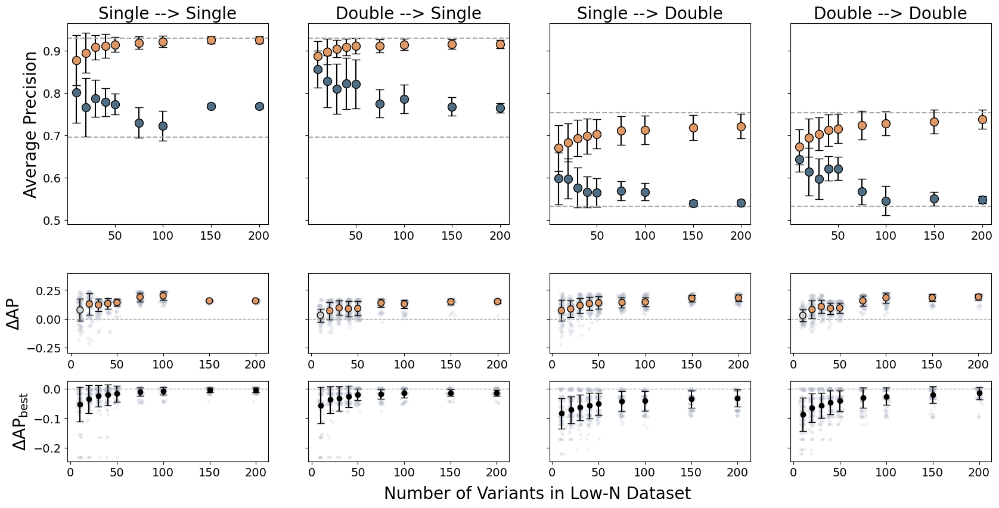

In [77]:
#worst_color = '#ffefd3'
worst_color = '#516f84'
#best_color = '#0064a8'
best_color = '#df9966'
jitter_color = "#ADB6C4"
sig_color = "#BB4A12"

neutral_color = "lightgrey"

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20,10), sharey='row',
                        gridspec_kw={'height_ratios':[3,1,1]})


n_selection = [10,20,30,40,50,75,100,150,200]
name = 'A4_HUMAN_Seuma_2022'
variant_types = ['single','single','multi','multi']
#dataset_names = ['A4_HUMAN_Seuma_2022_single','A4_HUMAN_Seuma_2022_single','A4_HUMAN_Seuma_2022_multi','A4_HUMAN_Seuma_2022_multi',]
alternative_names = ['Single --> Single','Double --> Single','Single --> Double','Double --> Double']
metric = 'average_precision'
np.random.seed(42) # Set seed for reproducibility

# Iterate over the datasets
for ax,vtype in enumerate(variant_types):
    full_name = f'{name}_{vtype}'
    ax_top = axes[0, ax]
    ax_bottom = axes[1, ax]
    ax_bottom2 = axes[2, ax]

    best_ = np.zeros((len(n_selection),iterations))
    worst_ = np.zeros((len(n_selection),iterations))
    significance = []
    d_values = []
    for i,n in enumerate(n_selection):

        # Determine the appropriate suffix based on whether it's single or multi
        if ax%2 == 0:
            suffix = f'_single_selection_n{n}'
        else:
            suffix = f'_multi_selection_n{n}'
        # Iterate over the iterations
        for ite in range(iterations):
            best_model = zsm_module.best_models_correct[name+suffix][f'ite{ite}']['overall']
            worst_model = zsm_module.worst_models_correct[name+suffix][f'ite{ite}']['overall']
            best_[i,ite] = zsm_module.metric_results[full_name][(f'{metric}','avg')][best_model]
            worst_[i,ite] = zsm_module.metric_results[full_name][(f'{metric}','avg')][worst_model]

        # Calculate the statistical significance between best and worst models and store it
        #significant_, p_val = one_sided_ttest(best_[i], worst_[i])
        t_stat, p_val = ttest_rel(best_[i], worst_[i], alternative='greater')
        significant_ = p_val < 0.05
        significance.append(significant_)

        diff_ = best_[i] - worst_[i]
        d_values.append(cohens_d_paired(best_[i], worst_[i]))
    d_colors = []
    for d in d_values:
        if d < 0.2:
            d_colors.append(worst_color)  # small
        elif d < 0.8:
            d_colors.append(neutral_color)  # medium
        else:
            d_colors.append(best_color)  # large
    # Top plot: best and worst models with error bars
    ax_top.errorbar(n_selection, best_.mean(axis=1), yerr=best_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=best_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)
    ax_top.errorbar(n_selection, worst_.mean(axis=1), yerr=worst_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=worst_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)

    ax_top.axhline(zsm_module.metric_results[full_name]['average_precision']['avg']
                   [zsm_module.best_models[full_name]['overall']], color='darkgray', ls='--')
    ax_top.axhline(zsm_module.metric_results[full_name]['average_precision']['avg']
                   [zsm_module.worst_models[full_name]['overall']], color='darkgray', ls='--')

    ax_top.set_title(alternative_names[ax], fontsize=20)
    ax_top.tick_params(axis='both', which='major', labelsize=14)
    ax_top.set_box_aspect(1)
    
    # Bottom plot: difference between best and worst models
    diff_ = best_ - worst_
    mean_diff = diff_.mean(axis=1)
    std_diff = diff_.std(axis=1)

    # jittered points
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom.scatter([n + j for j in jitter], diff_[i, :],
                          color=jitter_color, alpha=0.2, s=20, edgecolor='k', lw=0)

    # mean ± std overlay
    ax_bottom.errorbar(
        n_selection, mean_diff, yerr=std_diff, fmt='o', lw=1.2,
        ecolor='k', capsize=4, markersize=0,
        markeredgecolor='k', color='none'
    )
    ax_bottom.scatter(
        n_selection, mean_diff, c=d_colors, s=60, edgecolor='k', zorder=3
    )

    # add 0 line
    ax_bottom.axhline(0, color='darkgray', ls='--', lw=1)

    # optional significance marker
    # for i, sig in enumerate(significance):
    #     if sig:
    #         ax_bottom.text(n_selection[i], std_diff[i] + mean_diff[i] + 0.005,
    #                        '*', color=sig_color, ha='center', fontsize=18)

    ax_bottom.tick_params(axis='both', which='major', labelsize=14)
    ax_bottom.set_box_aspect(0.4)

    # for i, (n, d) in enumerate(zip(n_selection, d_values)):
    #     ax_bottom.text(n,-0.3,#  mean_diff[i] - std_diff[i] - 0.2,
    #                 f"{d:.2f}", ha='center', va='bottom',
    #                 fontsize=9, color='black', alpha=0.8, rotation=90)

    # Compute average precision of the true best model over all variants
    global_best_score = zsm_module.metric_results[full_name]['average_precision']['avg'][
        zsm_module.best_models[full_name]['overall']
    ]

    # Compute the difference between selected best and global best for each iteration
    dist_to_global = np.zeros((len(n_selection), iterations))
    for i, n in enumerate(n_selection):
        if ax%2 == 0:
            suffix = f'_single_selection_n{n}'
        else:
            suffix = f'_multi_selection_n{n}'
        for ite in range(iterations):
            best_model = zsm_module.best_models[name+suffix][f'ite{ite}']['overall']
            dist_to_global[i, ite] = (
                zsm_module.metric_results[full_name][(metric,'avg')][best_model]
                - global_best_score
            )

    # Jittered points (for iterations)
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom2.scatter(
            [n + j for j in jitter],
            dist_to_global[i, :],
            color=jitter_color, alpha=0.2, s=15, edgecolor='none'
        )

    # Mean ± std bars
    mean_dist = dist_to_global.mean(axis=1)
    std_dist = dist_to_global.std(axis=1)

    ax_bottom2.errorbar(
        n_selection, mean_dist, yerr=std_dist, fmt='o-', lw=0,
        color='black', ecolor='k', elinewidth=1.5, capsize=4
    )

    # Reference line at 0 (perfect selection)
    ax_bottom2.axhline(0, color='darkgray', ls='--', lw=1)
    ax_bottom2.set_box_aspect(0.4)
    ax_bottom2.tick_params(axis='both', which='major', labelsize=14)

for ax_bottom in axes[1, :]:
    ax_bottom.set_ylim(-0.3, 0.4)
axes[2,2].set_xlabel('Number of Variants in Low-N Dataset', fontsize=20)
axes[2,2].xaxis.set_label_coords(-0.06, -0.3)
axes[0,0].set_ylabel('Average Precision', fontsize=20)
axes[1,0].set_ylabel('ΔAP', fontsize=20)
axes[2,0].set_ylabel(r'ΔAP$_{\text{best}}$', fontsize=20)
#plt.tight_layout()
#plt.subplots_adjust(hspace=0.01)   # a little more if rows look too tight
plt.show()

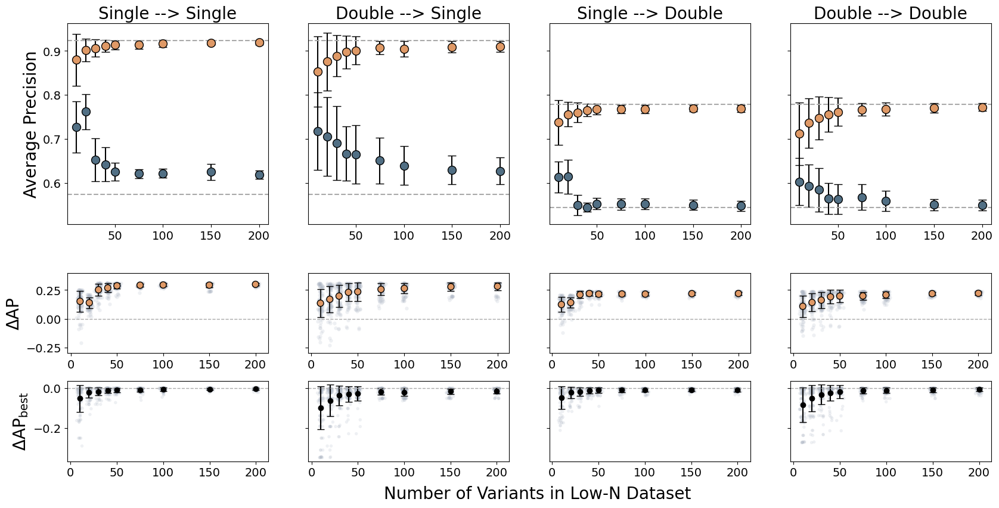

In [81]:
#worst_color = '#ffefd3'
worst_color = '#516f84'
#best_color = '#0064a8'
best_color = '#df9966'
jitter_color = "#ADB6C4"
sig_color = "#BB4A12"

neutral_color = "lightgrey"

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20,10), sharey='row',
                        gridspec_kw={'height_ratios':[3,1,1]})


n_selection = [10,20,30,40,50,75,100,150,200]
name = 'YAP1_HUMAN_Araya_2012'
alternative_names = ['Single --> Single','Double --> Single','Single --> Double','Double --> Double']
metric = 'average_precision'
np.random.seed(42) # Set seed for reproducibility

# Iterate over the datasets
for ax,vtype in enumerate(variant_types):
    full_name = f'{name}_{vtype}'
    ax_top = axes[0, ax]
    ax_bottom = axes[1, ax]
    ax_bottom2 = axes[2, ax]

    best_ = np.zeros((len(n_selection),iterations))
    worst_ = np.zeros((len(n_selection),iterations))
    significance = []
    d_values = []
    for i,n in enumerate(n_selection):

        # Determine the appropriate suffix based on whether it's single or multi
        if ax%2 == 0:
            suffix = f'_single_selection_n{n}'
        else:
            suffix = f'_multi_selection_n{n}'
        # Iterate over the iterations
        for ite in range(iterations):
            best_model = zsm_module.best_models_correct[name+suffix][f'ite{ite}']['overall']
            worst_model = zsm_module.worst_models_correct[name+suffix][f'ite{ite}']['overall']
            best_[i,ite] = zsm_module.metric_results[full_name][(f'{metric}','avg')][best_model]
            worst_[i,ite] = zsm_module.metric_results[full_name][(f'{metric}','avg')][worst_model]

        # Calculate the statistical significance between best and worst models and store it
        #significant_, p_val = one_sided_ttest(best_[i], worst_[i])
        t_stat, p_val = ttest_rel(best_[i], worst_[i], alternative='greater')
        significant_ = p_val < 0.05
        significance.append(significant_)

        diff_ = best_[i] - worst_[i]
        d_values.append(cohens_d_paired(best_[i], worst_[i]))
    d_colors = []
    for d in d_values:
        if d < 0.2:
            d_colors.append(worst_color)  # small
        elif d < 0.8:
            d_colors.append(neutral_color)  # medium
        else:
            d_colors.append(best_color)  # large
    # Top plot: best and worst models with error bars
    ax_top.errorbar(n_selection, best_.mean(axis=1), yerr=best_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=best_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)
    ax_top.errorbar(n_selection, worst_.mean(axis=1), yerr=worst_.std(axis=1),
                    marker='o', lw=0, capsize=5, color=worst_color,
                    ecolor='k', elinewidth=1.5, markeredgecolor='k', markersize=10)

    ax_top.axhline(zsm_module.metric_results[full_name]['average_precision']['avg']
                   [zsm_module.best_models[full_name]['overall']], color='darkgray', ls='--')
    ax_top.axhline(zsm_module.metric_results[full_name]['average_precision']['avg']
                   [zsm_module.worst_models[full_name]['overall']], color='darkgray', ls='--')

    ax_top.set_title(alternative_names[ax], fontsize=20)
    ax_top.tick_params(axis='both', which='major', labelsize=14)
    ax_top.set_box_aspect(1)
    
    # Bottom plot: difference between best and worst models
    diff_ = best_ - worst_
    mean_diff = diff_.mean(axis=1)
    std_diff = diff_.std(axis=1)

    # jittered points
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom.scatter([n + j for j in jitter], diff_[i, :],
                          color=jitter_color, alpha=0.2, s=20, edgecolor='k', lw=0)

    # mean ± std overlay
    ax_bottom.errorbar(
        n_selection, mean_diff, yerr=std_diff, fmt='o', lw=1.2,
        ecolor='k', capsize=4, markersize=0,
        markeredgecolor='k', color='none'
    )
    ax_bottom.scatter(
        n_selection, mean_diff, c=d_colors, s=60, edgecolor='k', zorder=3
    )

    # add 0 line
    ax_bottom.axhline(0, color='darkgray', ls='--', lw=1)

    # optional significance marker
    # for i, sig in enumerate(significance):
    #     if sig:
    #         ax_bottom.text(n_selection[i], std_diff[i] + mean_diff[i] + 0.005,
    #                        '*', color=sig_color, ha='center', fontsize=18)

    ax_bottom.tick_params(axis='both', which='major', labelsize=14)
    ax_bottom.set_box_aspect(0.4)

    # for i, (n, d) in enumerate(zip(n_selection, d_values)):
    #     ax_bottom.text(n,-0.3,#  mean_diff[i] - std_diff[i] - 0.2,
    #                 f"{d:.2f}", ha='center', va='bottom',
    #                 fontsize=9, color='black', alpha=0.8, rotation=90)

    # Compute average precision of the true best model over all variants
    global_best_score = zsm_module.metric_results[full_name]['average_precision']['avg'][
        zsm_module.best_models[full_name]['overall']
    ]

    # Compute the difference between selected best and global best for each iteration
    dist_to_global = np.zeros((len(n_selection), iterations))
    for i, n in enumerate(n_selection):
        if ax%2 == 0:
            suffix = f'_single_selection_n{n}'
        else:
            suffix = f'_multi_selection_n{n}'
        for ite in range(iterations):
            best_model = zsm_module.best_models[name+suffix][f'ite{ite}']['overall']
            dist_to_global[i, ite] = (
                zsm_module.metric_results[full_name][(metric,'avg')][best_model]
                - global_best_score
            )

    # Jittered points (for iterations)
    for i, n in enumerate(n_selection):
        jitter = np.random.normal(0, 1, size=iterations) * 1.5
        ax_bottom2.scatter(
            [n + j for j in jitter],
            dist_to_global[i, :],
            color=jitter_color, alpha=0.2, s=15, edgecolor='none'
        )

    # Mean ± std bars
    mean_dist = dist_to_global.mean(axis=1)
    std_dist = dist_to_global.std(axis=1)

    ax_bottom2.errorbar(
        n_selection, mean_dist, yerr=std_dist, fmt='o-', lw=0,
        color='black', ecolor='k', elinewidth=1.5, capsize=4
    )

    # Reference line at 0 (perfect selection)
    ax_bottom2.axhline(0, color='darkgray', ls='--', lw=1)
    ax_bottom2.set_box_aspect(0.4)
    ax_bottom2.tick_params(axis='both', which='major', labelsize=14)

for ax_bottom in axes[1, :]:
    ax_bottom.set_ylim(-0.3, 0.4)
axes[2,2].set_xlabel('Number of Variants in Low-N Dataset', fontsize=20)
axes[2,2].xaxis.set_label_coords(-0.06, -0.3)
axes[0,0].set_ylabel('Average Precision', fontsize=20)
axes[1,0].set_ylabel('ΔAP', fontsize=20)
axes[2,0].set_ylabel(r'ΔAP$_{\text{best}}$', fontsize=20)
#plt.tight_layout()
#plt.subplots_adjust(hspace=0.01)   # a little more if rows look too tight
plt.show()

Significant difference between best and worst models for A4_HUMAN_Seuma_2022_single: True (p-value: 3.7120023065651125e-05)
Significant difference between best and worst models for A4_HUMAN_Seuma_2022_single2: True (p-value: 0.00022579563765250956)
Significant difference between best and worst models for YAP1_HUMAN_Araya_2012_single: True (p-value: 1.2494988494578078e-09)
Significant difference between best and worst models for YAP1_HUMAN_Araya_2012_single2: True (p-value: 6.388214466511107e-06)


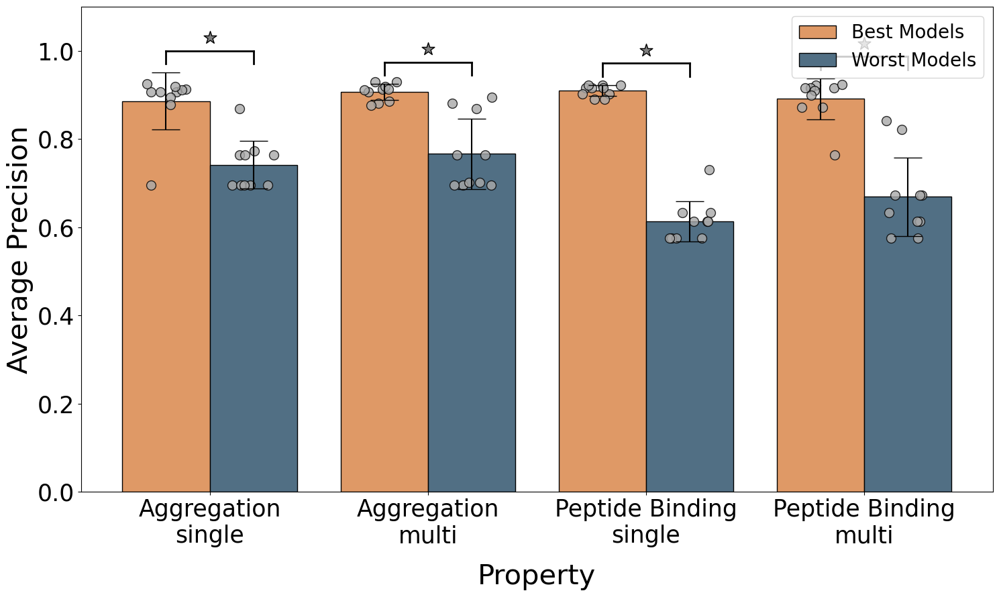

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A4_HUMAN_Seuma_2022_single','A4_HUMAN_Seuma_2022_single2','YAP1_HUMAN_Araya_2012_single','YAP1_HUMAN_Araya_2012_single2'],
                   iteration_names=['A4_HUMAN_Seuma_2022_single_selection','A4_HUMAN_Seuma_2022_multi_selection','YAP1_HUMAN_Araya_2012_single_selection','YAP1_HUMAN_Araya_2012_multi_selection'],
                    metric = 'average_precision',xlabel='Property',ylabel='Average Precision',
                    alternative_names=['Aggregation\nsingle','Aggregation\nmulti','Peptide Binding\nsingle','Peptide Binding\nmulti'],
                    ylimit=1.1, figsize=(15,9), format='svg')

Significant difference between best and worst models for A4_HUMAN_Seuma_2022_single: True (p-value: 1.5296434221345896e-06)
Significant difference between best and worst models for A4_HUMAN_Seuma_2022_single2: True (p-value: 0.00022579563765250956)
Significant difference between best and worst models for YAP1_HUMAN_Araya_2012_single: True (p-value: 1.2494988494578078e-09)
Significant difference between best and worst models for YAP1_HUMAN_Araya_2012_single2: True (p-value: 5.901356984251625e-06)


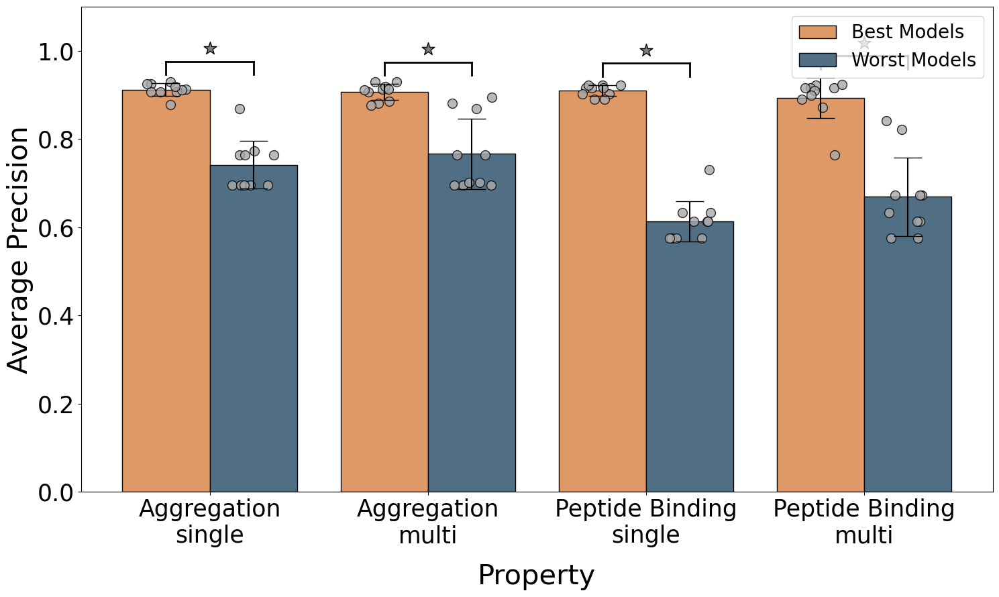

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A4_HUMAN_Seuma_2022_single','A4_HUMAN_Seuma_2022_single2','YAP1_HUMAN_Araya_2012_single','YAP1_HUMAN_Araya_2012_single2'],
                   iteration_names=['A4_HUMAN_Seuma_2022_single_selection','A4_HUMAN_Seuma_2022_multi_selection','YAP1_HUMAN_Araya_2012_single_selection','YAP1_HUMAN_Araya_2012_multi_selection'],
                    metric = 'average_precision',xlabel='Property',ylabel='Average Precision',
                    alternative_names=['Aggregation\nsingle','Aggregation\nmulti','Peptide Binding\nsingle','Peptide Binding\nmulti'],
                    ylimit=1.1, figsize=(15,9), format='svg',use_correct_best=True)

# Comparison to other models

### Making wildtype datasets and reference file

In [41]:
from src.PRIZM_helper_functions import reference_builder

In [45]:
ref_ = pd.read_csv('../ModellerModule/reference_files/DMS_substitutions_ProteinGym.csv').set_index('DMS_id')
ref_sel = ref_.loc[['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016',
                    'MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']]

In [ ]:
ids = []
seqs = []
wt_scores = []
msa_names = []
msa_weights = []
msa_num_seqs = []
pdbs = []

for i,row in ref_sel.iterrows():
    wt_csv = pd.DataFrame(columns=['mutant','mutated_sequence','DMS_score','DMS_score_bin'])
    id_ = row.name
    seq_ = row.target_seq
    wt_score_ = row.DMS_binarization_cutoff
    msa_name_ = row.MSA_filename[:-4]
    msa_weights_ = row.weight_file_name
    msa_num_seqs_ = row.MSA_len
    pdb_ = row.pdb_file
    first_aa = seq_[0]
    wt_csv.loc[0] = [first_aa+str(1)+first_aa, seq_, wt_score_, 1]
    wt_csv.to_csv(f'../data/validation/WT/{id_}_wildtype.csv', index=False)

    ids.append(id_)
    seqs.append(seq_)
    wt_scores.append(wt_score_)
    msa_names.append(msa_name_)
    msa_weights.append(msa_weights_)
    msa_num_seqs.append(msa_num_seqs_)
    pdbs.append(pdb_)

custom_ids = ['wildtype']*len(ids)
reference_name = 'Comparison_Wildtypes_reference.csv'
reference = reference_builder(len(ids), ids, seqs, msa_names, msa_num_seqs, pdbs, reference_name, custom_ids, msa_weights)

In [49]:
ref_sel = ref_.loc[['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016','SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012']]
ids = []
seqs = []
wt_scores = []
msa_names = []
msa_weights = []
msa_num_seqs = []
pdbs = []

for i,row in ref_sel.iterrows():
    wt_csv = pd.DataFrame(columns=['mutant','mutated_sequence','DMS_score','DMS_score_bin'])
    id_ = row.name
    seq_ = row.target_seq
    wt_score_ = row.DMS_binarization_cutoff
    msa_name_ = row.MSA_filename[:-4]
    msa_weights_ = row.weight_file_name
    msa_num_seqs_ = row.MSA_len
    pdb_ = row.pdb_file
    first_aa = seq_[0]
    wt_csv.loc[0] = [first_aa+str(1)+first_aa, seq_, wt_score_, 1]
    wt_csv.to_csv(f'../data/validation/WT/{id_}_wildtype.csv', index=False)

    ids.append(id_)
    seqs.append(seq_)
    wt_scores.append(wt_score_)
    msa_names.append(msa_name_)
    msa_weights.append(msa_weights_)
    msa_num_seqs.append(msa_num_seqs_)
    pdbs.append(pdb_)

custom_ids = ['wildtype']*len(ids)
reference_name = 'Comparison_Wildtypes_reference_2.csv'
reference = reference_builder(len(ids), ids, seqs, msa_names, msa_num_seqs, pdbs, reference_name, custom_ids, msa_weights)

In [50]:
ref_sel = ref_.loc[['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']]
ids = []
seqs = []
wt_scores = []
msa_names = []
msa_weights = []
msa_num_seqs = []
pdbs = []

for i,row in ref_sel.iterrows():
    wt_csv = pd.DataFrame(columns=['mutant','mutated_sequence','DMS_score','DMS_score_bin'])
    id_ = row.name
    seq_ = row.target_seq
    wt_score_ = row.DMS_binarization_cutoff
    msa_name_ = row.MSA_filename[:-4]
    msa_weights_ = row.weight_file_name
    msa_num_seqs_ = row.MSA_len
    pdb_ = row.pdb_file
    first_aa = seq_[0]
    wt_csv.loc[0] = [first_aa+str(1)+first_aa, seq_, wt_score_, 1]
    wt_csv.to_csv(f'../data/validation/WT/{id_}_wildtype.csv', index=False)

    ids.append(id_)
    seqs.append(seq_)
    wt_scores.append(wt_score_)
    msa_names.append(msa_name_)
    msa_weights.append(msa_weights_)
    msa_num_seqs.append(msa_num_seqs_)
    pdbs.append(pdb_)

custom_ids = ['wildtype']*len(ids)
reference_name = 'Comparison_Wildtypes_reference_3.csv'
reference = reference_builder(len(ids), ids, seqs, msa_names, msa_num_seqs, pdbs, reference_name, custom_ids, msa_weights)

## Hie et al. 2023

### Initializa Data

In [6]:
zsm_module.set_threshold('ADRB2_HUMAN_Jones_2020_selection',1.859962)
zsm_module.set_threshold('BLAT_ECOLX_Stiffler_2015_selection',-1.159498916)
zsm_module.set_threshold('ENV_HV1BR_Haddox_2016_selection',0.0191127558)
zsm_module.set_threshold('A0A2Z5U3Z0_9INFA_Doud_2016_selection',-2.239942981)
zsm_module.set_threshold('C6KNH7_9INFA_Lee_2018_selection',-1.720276237)
zsm_module.set_threshold('IF1_ECOLI_Kelsic_2016_selection',0.8)
zsm_module.set_threshold('MK01_HUMAN_Brenan_2016_selection',0)
zsm_module.set_threshold('P53_HUMAN_Giacomelli_2018_Null_Etoposide_selection',-0.5)

zsm_module.set_threshold('ADRB2_HUMAN_Jones_2020',2.8)
zsm_module.set_threshold('BLAT_ECOLX_Stiffler_2015',0.01)
zsm_module.set_threshold('ENV_HV1BR_Haddox_2016',0.1)
zsm_module.set_threshold('A0A2Z5U3Z0_9INFA_Doud_2016',0.1)
zsm_module.set_threshold('C6KNH7_9INFA_Lee_2018',0.1)
zsm_module.set_threshold('IF1_ECOLI_Kelsic_2016',0.98)
zsm_module.set_threshold('MK01_HUMAN_Brenan_2016',2.5)
zsm_module.set_threshold('P53_HUMAN_Giacomelli_2018_Null_Etoposide',1)

In [6]:
zsm_module.load_scores('ADRB2_HUMAN_Jones_2020',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('BLAT_ECOLX_Stiffler_2015',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('ENV_HV1BR_Haddox_2016',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('A0A2Z5U3Z0_9INFA_Doud_2016',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('C6KNH7_9INFA_Lee_2018',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('IF1_ECOLI_Kelsic_2016',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('MK01_HUMAN_Brenan_2016',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('P53_HUMAN_Giacomelli_2018_Null_Etoposide',wt=True,model_list=model_list,wt_external=True)

In [106]:
MAPK1_fitness_xlsx = pd.read_excel('../data/validation/science.adr6006_data_s2.xlsx', sheet_name='brenan_labels')

In [107]:
for row in zsm_module.datasets['MK01_HUMAN_Brenan_2016']['exp_data'].itertuples():
    if row.mutant in MAPK1_fitness_xlsx['variant'].values:
        fitness = MAPK1_fitness_xlsx[MAPK1_fitness_xlsx['variant']==row.mutant]['fitness'].values[0]
        zsm_module.datasets['MK01_HUMAN_Brenan_2016']['exp_data'].loc[row.Index,'DMS_score'] = fitness
        zsm_module.datasets['MK01_HUMAN_Brenan_2016']['exp_data'].loc[row.Index,'DMS_score_bin'] = 1 if fitness>=zsm_module.threshold['MK01_HUMAN_Brenan_2016'] else 0
    else:
        print(f'No fitness for {row.mutant} in Brenan dataset')

In [108]:
for prot in ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']:
    exp_ = zsm_module.datasets[prot]['exp_data']
    exp_ = exp_[exp_['mutant'].str.contains('WT')==False]
    np.random.seed(19)#(24)
    for n in [20,50]:
        zsm_module.set_threshold(f'{prot}_selection_n{n}',zsm_module.threshold[f'{prot}_selection'])
        zsm_module.model_list[f'{prot}_selection_n{n}'] = zsm_module.model_list[prot]
        zsm_module.name_list[f'{prot}_selection_n{n}'] = zsm_module.name_list[prot]
        zsm_module.datasets[f'{prot}_selection_n{n}'] = {}
        mutants_sel = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
        for i in range(iterations-1):
            mut_ = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
            if exp_.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_.loc[mut_]["DMS_score_bin"].mean() == 1:
                print(f'WARNING: ALL SAME CLASS FOR {prot} with n={n} in iteration {i}, RESAMPLING')
                while exp_.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_.loc[mut_]["DMS_score_bin"].mean() == 1:
                    mut_ = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
            mutants_sel += mut_
        data_ = exp_.loc[mutants_sel].reset_index()
        data_ = data_.drop(columns=['index','DMS_score_bin'])
        data_['DMS_score_bin'] = data_['DMS_score'].apply(lambda x: 1 if x > zsm_module.threshold[f'{prot}_selection_n{n}'] else 0)
        zsm_module.datasets[f'{prot}_selection_n{n}']['exp_data'] = data_
        for model in zsm_module.name_list[prot]:
            data_ = zsm_module.datasets[prot][model]
            data_ = data_.loc[mutants_sel].reset_index()
            zsm_module.datasets[f'{prot}_selection_n{n}'][model] = data_.drop(columns='index')

### Process Datasets

In [109]:
for prot in ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']:
    for n in [20,50]:
        zsm_module.compute_metrics_iterations(f'{prot}_selection_n{n}',n_bootstrap=n_bootstrap,ite_size=n,metrics=['spearmanr','average_precision'],iterations=iterations)
        zsm_module.process_models_iteration(f'{prot}_selection_n{n}',iterations=iterations,ite_size=n)

c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:771: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'avg')] = corr_list_
c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:772: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'std')] = std_list_
c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:773: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selection_n20.
No models with correct signs found for all for ENV_HV1BR_Haddox_2016_selecti

c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:771: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'avg')] = corr_list_
c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:772: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'std')] = std_list_
c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:773: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_2016_selection_n50.
No models with correct signs found for all for MK01_HUMAN_Brenan_

c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:771: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'avg')] = corr_list_
c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:772: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'std')] = std_list_
c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:773: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

In [110]:
#ks = [9,10,13,15,16,17,31,32,40,80]
ks = [10]

for dataset in ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']:
    best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n20'][f'ite0'].values()))
    zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n20'], above_wt=False,custom_name=f'ite0_n20')
    for i in range(1,iterations):
        best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n20'][f'ite{i}'].values()))
        zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n20'],previous_hitrate_multi=True,above_wt=False, custom_name=f'ite{i}_n20')

    for i in range(iterations):
        best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n50'][f'ite{i}'].values()))
        zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n50'],previous_hitrate_multi=True,above_wt=False, custom_name=f'ite{i}_n50')

In [42]:
# for dataset in ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']:

#     for i in range(iterations):
#         best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n20'][f'ite{i}'].values()))
#         zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n20'],previous_hitrate_multi=True, above_wt=False, model_weighting=zsm_module.combined_metric[dataset+'_selection_n20'][f'ite{i}'],weight_scaling=2,custom_name=f'ite{i}_n20_weight2')
#         zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n20'],previous_hitrate_multi=True, above_wt=False, model_weighting=zsm_module.combined_metric[dataset+'_selection_n20'][f'ite{i}'],weight_scaling=8,custom_name=f'ite{i}_n20_weight8')
#         best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n50'][f'ite{i}'].values()))
#         zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n50'],previous_hitrate_multi=True, above_wt=False, model_weighting=zsm_module.combined_metric[dataset+'_selection_n50'][f'ite{i}'],weight_scaling=2,custom_name=f'ite{i}_n50_weight2')
#         zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n50'],previous_hitrate_multi=True, above_wt=False, model_weighting=zsm_module.combined_metric[dataset+'_selection_n50'][f'ite{i}'],weight_scaling=8,custom_name=f'ite{i}_n50_weight8')

In [12]:
# for dataset in ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']:

#     for i in range(iterations):
#         best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n20'][f'ite{i}'].values()))
#         top2_ = zsm_module.combined_metric[dataset+'_selection_n20'][f'ite{i}'][best_models_].nlargest(2).index.tolist()
#         top3_ = zsm_module.combined_metric[dataset+'_selection_n20'][f'ite{i}'][best_models_].nlargest(3).index.tolist()
#         zsm_module.compute_hit_rate_multi(dataset, top2_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n20'],previous_hitrate_multi=True, above_wt=False,custom_name=f'ite{i}_n20_top2')
#         zsm_module.compute_hit_rate_multi(dataset, top3_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n20'],previous_hitrate_multi=True, above_wt=False,custom_name=f'ite{i}_n20_top3')
        
#         best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n50'][f'ite{i}'].values()))
#         top2_ = zsm_module.combined_metric[dataset+'_selection_n50'][f'ite{i}'][best_models_].nlargest(2).index.tolist()
#         top3_ = zsm_module.combined_metric[dataset+'_selection_n50'][f'ite{i}'][best_models_].nlargest(3).index.tolist()
#         zsm_module.compute_hit_rate_multi(dataset, top2_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n50'],previous_hitrate_multi=True, above_wt=False,custom_name=f'ite{i}_n50_top2')
#         zsm_module.compute_hit_rate_multi(dataset, top3_,n_bootstrap=n_bootstrap, ks=ks, previous_metrics=zsm_module.metric_results[dataset+'_selection_n50'],previous_hitrate_multi=True, above_wt=False,custom_name=f'ite{i}_n50_top3')

In [13]:
ks = [9,10,13,15,16,17,31,32,40,80]
# Compute the hit rate, using Hie et al. 2022 and EVOLVEpro as a reference for the number of top variants
zsm_module.compute_hit_rate('ADRB2_HUMAN_Jones_2020',n_bootstrap=n_bootstrap, ks = ks)#,previous_metrics=zsm_module.metric_results['ADRB2_HUMAN_Jones_2020_selection'])
zsm_module.compute_hit_rate('BLAT_ECOLX_Stiffler_2015',n_bootstrap=n_bootstrap, ks = ks)#,previous_metrics=zsm_module.metric_results['BLAT_ECOLX_Stiffler_2015_selection'])
zsm_module.compute_hit_rate('ENV_HV1BR_Haddox_2016',n_bootstrap=n_bootstrap, ks = ks)#,previous_metrics=zsm_module.metric_results['ENV_HV1BR_Haddox_2016_selection'])
zsm_module.compute_hit_rate('A0A2Z5U3Z0_9INFA_Doud_2016',n_bootstrap=n_bootstrap, ks = ks)#,previous_metrics=zsm_module.metric_results['A0A2Z5U3Z0_9INFA_Doud_2016_selection'])
zsm_module.compute_hit_rate('C6KNH7_9INFA_Lee_2018',n_bootstrap=n_bootstrap, ks = ks)#,previous_metrics=zsm_module.metric_results['C6KNH7_9INFA_Lee_2018_selection'])
zsm_module.compute_hit_rate('IF1_ECOLI_Kelsic_2016',n_bootstrap=n_bootstrap, ks = ks)#,previous_metrics=zsm_module.metric_results['IF1_ECOLI_Kelsic_2016_selection'])
zsm_module.compute_hit_rate('MK01_HUMAN_Brenan_2016',n_bootstrap=n_bootstrap, ks = ks)#,previous_metrics=zsm_module.metric_results['MK01_HUMAN_Brenan_2016_selection'])
zsm_module.compute_hit_rate('P53_HUMAN_Giacomelli_2018_Null_Etoposide',n_bootstrap=n_bootstrap, ks = ks)#,previous_metrics=zsm_module.metric_results['P53_HUMAN_Giacomelli_2018_Null_Etoposide_selection'])


### Plot

In [112]:
hie_hit_rate = [0.22,0.4,0.23,0.16,0.31,0.5,0.077,0.12]

(0.0, 0.8)

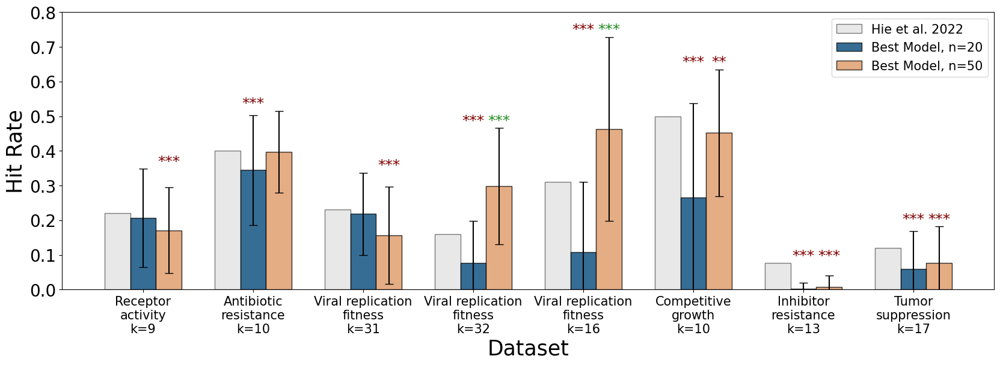

In [113]:
dataset_names = ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']
alternative_names=['Receptor\nactivity\nk=9','Antibiotic\nresistance\nk=10','Viral replication\nfitness\nk=31','Viral replication\nfitness\nk=32',
                                       'Viral replication\nfitness\nk=16','Competitive\ngrowth\nk=10','Inhibitor\nresistance\nk=13','Tumor\nsuppression\nk=17']
ks = [9,10,31,32,16,10,13,17]

width = 0.70

fig, ax = plt.subplots(figsize=(20, 6))
n = 20,50
for i in range(len(dataset_names)):
    name = dataset_names[i]
    #k = ks[i]
    k = 10

    #best_models_1 = [zsm_module.best_models_correct[name + f'_selection_n{n[0]}'][f'ite{idx}']['overall'] for idx in range(0, 99)]
    #best_models_2 = [zsm_module.best_models_correct[name + f'_selection_n{n[1]}'][f'ite{idx}']['overall'] for idx in range(0, 99)]

    #metrics_1 = zsm_module.metric_results[name].loc[best_models_1][f'hit_rate_top{k}']['avg']
    #metrics_2 = zsm_module.metric_results[name].loc[best_models_2][f'hit_rate_top{k}']['avg']

    index1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].index.str.contains('n20')
    index2 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].index.str.contains('n50')
    
    metrics_1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].loc[index1]['avg']
    metrics_2 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].loc[index2]['avg']

    sig1,p1 = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate[i])
    sig2,p2 = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate[i])

    sig1_neg,p1_neg = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate[i], alternative='less')
    sig2_neg,p2_neg = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate[i], alternative='less')


    n_bars = 3
    
    ax.bar(i+0 * width/n_bars,hie_hit_rate[i],width=width/n_bars,color='lightgray', alpha=0.5, capsize=5,edgecolor='k', label='Hie et al. 2022')
    ax.bar(i+1 * width/n_bars, metrics_1.mean(), yerr=metrics_1.std(),width=width/n_bars, color="#03497A", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, n=20')
    ax.bar(i+2 * width/n_bars, metrics_2.mean(), yerr=metrics_2.std(),width=width/n_bars, color="#DF9966", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, n=50')

    # Add significance stars
    y_max = max(hie_hit_rate[i], metrics_1.mean()+metrics_1.std(), metrics_2.mean()+metrics_2.std())
    y = y_max * 1.00

    for s, (sig,pval, negsig,p_val_neg) in enumerate(zip([sig1, sig2],
                                                       [p1, p2],
                                                       [sig1_neg, sig2_neg],
                                                       [p1_neg, p2_neg])):
        stars = ''
        if sig and negsig:
            stars = '≈'
            print(f'WARNING: Contradictory statistical test results for {name}, p-values: {pval} (greater), {p_val_neg} (less)')
        elif sig:
            sig_color = 'forestgreen'
            if pval < 0.001:
                stars = '***'
            elif pval < 0.01:
                stars = '**'
            elif pval < 0.05:
                stars = '*'
        elif negsig:
            sig_color = 'maroon'
            if p_val_neg < 0.001:
                stars = '***'
            elif p_val_neg < 0.01:
                stars = '**'
            elif p_val_neg < 0.05:
                stars = '*'
        else:
            sig_color = 'gray'
            stars = ''

        ax.text(i+(s+1) * width/n_bars, y, stars, ha='center', va='bottom', color=sig_color, fontsize=18)


handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), fontsize=15)

ax.set_xlabel("Dataset",fontsize=25)
ax.set_ylabel("Hit Rate",fontsize=25)
ax.set_xticks(np.arange(len(dataset_names)) + width/2 - width/(n_bars*2))
ax.set_xticklabels(alternative_names, rotation=0, ha="center", fontsize=15)

ax.tick_params(axis='y', which='major', labelsize=20)

ax.set_ylim(0,0.8)

In [114]:
datasets = ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']
from collections import Counter

results_PRIZM_HieData = pd.DataFrame(index=datasets, columns=['hit_rate','std'])
hit_rates_HieData_dict = {}
for dataset in datasets:
    exp_data_bin = zsm_module.datasets[dataset]['exp_data']['DMS_score_bin']
    pop_size = len(exp_data_bin)
    pop_success = exp_data_bin.sum()
    background = exp_data_bin.mean()
    hit_rates = []
    for i in range(iterations):
        best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n50'][f'ite{i}'].values()))
        better_than_wt = []

        for model in best_models_:
            wt_value = zsm_module.wildtype[dataset][model][model].values[0]
            scores = zsm_module.datasets[dataset][model][model]

            better_ = scores[scores >= wt_value]
            # Append indices of sequences better than wt to a common list
            better_than_wt.extend(better_.index.tolist())
            k = 2
            # Get indices of variants that are better than wt in at least k models
            count = Counter(better_than_wt)
            better_than_wt_k = [idx for idx, c in count.items() if c >= k]

            # If number of candidates is less than 4, set k to 1
            if len(better_than_wt_k) < 5:
                k = 1
                better_than_wt_k = [idx for idx, c in count.items() if c >= k]

            # If number of candidates is > 40, increase k until number of candidates is <= 40
            while len(better_than_wt_k) > 40 and k < len(best_models_):
                k += 1
                better_than_wt_k = [idx for idx, c in count.items() if c >= k]

            if len(better_than_wt_k) == 0:
                k = 0
                better_than_wt_k = []

    


        # Calculate fraction of true beneficial mutations among those predicted to be better than wt
        candidates = exp_data_bin[better_than_wt_k]
        sample_size = len(candidates)
        #sample_success = candidates.sum() if sample_size > 0 else 0
        hit_rate = candidates.mean() if sample_size > 0 else 0.0
        hit_rates.append(hit_rate)
        
    hit_rates_HieData_dict[dataset] = np.array(hit_rates)

    hit_rate_avg = np.mean(hit_rates)
    hit_rate_std = np.std(hit_rates)
    
    results_PRIZM_HieData.loc[dataset] = [hit_rate_avg, hit_rate_std]

(0.0, 0.8)

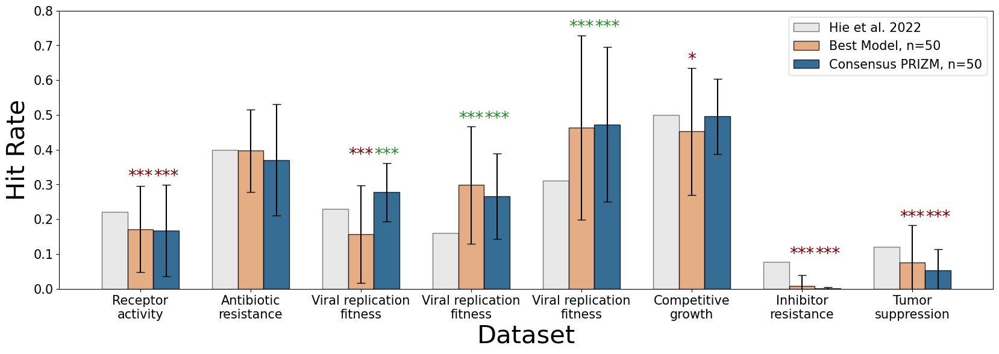

In [120]:
width = 0.70
alternative_names=['Receptor\nactivity','Antibiotic\nresistance','Viral replication\nfitness','Viral replication\nfitness',
                                       'Viral replication\nfitness','Competitive\ngrowth','Inhibitor\nresistance','Tumor\nsuppression']
fig, ax = plt.subplots(figsize=(20, 6))
for i in range(len(datasets)):
    name = datasets[i]
    #k = results_df.loc[name]['sample_size']
    k = 10
    hie_hit_rate_ = hie_hit_rate[i]

    index1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].index.str.contains('n50')
    
    metrics_1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].loc[index1]['avg']
    metrics_2 = hit_rates_HieData_dict[name]
    
    sig1,p1 = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate_)
    sig2,p2 = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate_)

    sig1_neg,p1_neg = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate_, alternative='less')
    sig2_neg,p2_neg = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate_, alternative='less')


    n_bars = 3
    
    ax.bar(i+0 * width/n_bars,hie_hit_rate_,width=width/n_bars,color='lightgray', alpha=0.5, capsize=5,edgecolor='k', label='Hie et al. 2022')
    ax.bar(i+1 * width/n_bars, metrics_1.mean(), yerr=metrics_1.std(),width=width/n_bars, color="#DF9966", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, n=50')
    ax.bar(i+2 * width/n_bars, metrics_2.mean(), yerr=metrics_2.std(),width=width/n_bars, color="#03497A", alpha=0.8, capsize=5,edgecolor='k',label='Consensus PRIZM, n=50')

    # Add significance stars
    y_max = max(hie_hit_rate_, metrics_1.mean()+metrics_1.std(), metrics_2.mean()+metrics_2.std())
    y = y_max * 1.00

    for s, (sig,pval, negsig,p_val_neg) in enumerate(zip([sig1, sig2],
                                                       [p1, p2],
                                                       [sig1_neg, sig2_neg],
                                                       [p1_neg, p2_neg])):
        stars = ''
        if sig and negsig:
            stars = '≈'
            print(f'WARNING: Contradictory statistical test results for {name}, p-values: {pval} (greater), {p_val_neg} (less)')
        elif sig:
            sig_color = 'forestgreen'
            # stars = '*'
            if pval < 0.0001:
                stars = '***'
            elif pval < 0.001:
                stars = '**'
            elif pval < 0.01:
                stars = '*'
        elif negsig:
            sig_color = 'maroon'
            # stars = '*'
            if p_val_neg < 0.0001:
                stars = '***'
            elif p_val_neg < 0.001:
                stars = '**'
            elif p_val_neg < 0.01:
                stars = '*'
        else:
            sig_color = 'gray'
            stars = ''

        ax.text(i+(s+1) * width/n_bars, y, stars, ha='center', va='bottom', color=sig_color, fontsize=20)


handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), fontsize=15)

ax.set_xlabel("Dataset",fontsize=30)
ax.set_ylabel("Hit Rate",fontsize=30)
ax.set_xticks(np.arange(len(datasets)) + width/2 - width/(n_bars*2))
ax.set_xticklabels(alternative_names, rotation=0, ha="center")

ax.tick_params(axis='both', which='major', labelsize=15)

ax.set_ylim(0,0.8)

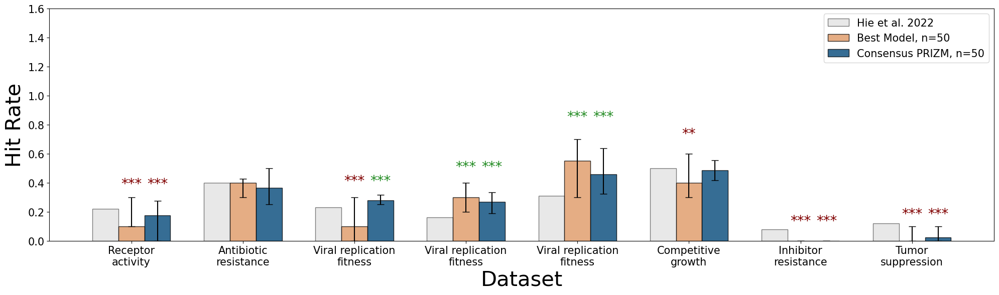

In [121]:
from scipy.stats import mannwhitneyu

width = 0.70
alternative_names=['Receptor\nactivity','Antibiotic\nresistance','Viral replication\nfitness','Viral replication\nfitness',
                                       'Viral replication\nfitness','Competitive\ngrowth','Inhibitor\nresistance','Tumor\nsuppression']

fig, ax = plt.subplots(figsize=(20, 6))

for i in range(len(datasets)):
    name = datasets[i]
    # k = results_df.loc[name]['sample_size']
    k = 10
    hie_hit_rate_ = hie_hit_rate[i]   # baseline (single deterministic value)

    # Subset PRIZM runs
    index1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].index.str.contains('n50')
    metrics_1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].loc[index1]['avg']     # Best model
    metrics_2 = hit_rates_HieData_dict[name]                                                     # Consensus PRIZM

    # Compute medians
    med1 = np.median(metrics_1)
    med2 = np.median(metrics_2)

    # Compute IQRs
    q1_1, q3_1 = np.percentile(metrics_1, [25, 75])
    q1_2, q3_2 = np.percentile(metrics_2, [25, 75])

    iqr1_lower = med1 - q1_1
    iqr1_upper = q3_1 - med1
    iqr2_lower = med2 - q1_2
    iqr2_upper = q3_2 - med2

    # Statistical comparison: Mann–Whitney U (one-sided PRIZM > Hie)
    # Hie is deterministic so we compare against a list of repeated values
    baseline_arr = np.repeat(hie_hit_rate_, len(metrics_1))

    # tests for Best model
    u1, p1 = mannwhitneyu(metrics_1, baseline_arr, alternative="greater")
    u1_neg, p1_neg = mannwhitneyu(metrics_1, baseline_arr, alternative="less")

    # tests for Consensus PRIZM
    baseline_arr = np.repeat(hie_hit_rate_, len(metrics_2))
    u2, p2 = mannwhitneyu(metrics_2, baseline_arr, alternative="greater")
    u2_neg, p2_neg = mannwhitneyu(metrics_2, baseline_arr, alternative="less")

    # Draw bars
    n_bars = 3
    base_x = i

    # HIE baseline (gray, no variability)
    ax.bar(base_x + 0 * width/n_bars, 
           hie_hit_rate_, 
           width=width/n_bars, 
           color='lightgray', alpha=0.5, edgecolor='k',
           label='Hie et al. 2022' if i == 0 else "")

    # Best model (median + IQR)
    ax.bar(base_x + 1 * width/n_bars, 
           med1, 
           width=width/n_bars, 
           yerr=[[iqr1_lower], [iqr1_upper]], 
           color="#DF9966", alpha=0.8, edgecolor='k', 
           capsize=5, 
           label='Best Model, n=50' if i == 0 else "")

    # Consensus PRIZM
    ax.bar(base_x + 2 * width/n_bars, 
           med2, 
           width=width/n_bars, 
           yerr=[[iqr2_lower], [iqr2_upper]], 
           color="#03497A", alpha=0.8, edgecolor='k',
           capsize=5, 
           label='Consensus PRIZM, n=50' if i == 0 else "")

    # y-value for significance stars
    y_max = max(hie_hit_rate_, q3_1, q3_2) * 1.15

    # Add significance for Best model and Consensus
    for s, (p_greater, p_less) in enumerate([(p1, p1_neg),
                                            (p2, p2_neg)]):

        # Determine stars & direction
        # if p_greater < 0.0001:
        #     stars, color = '*', 'green'
        # elif p_less < 0.0001:
        #     stars, color = '*', 'red'
        if p_greater < 0.0001:
            stars, color = '***', 'forestgreen'
        elif p_greater < 0.001:
            stars, color = '**', 'forestgreen'
        elif p_greater < 0.01:
            stars, color = '*', 'forestgreen'
        elif p_less < 0.0001:
            stars, color = '***', 'maroon'
        elif p_less < 0.001:
            stars, color = '**', 'maroon'
        elif p_less < 0.01:
            stars, color = '*', 'maroon'
        else:
            stars, color = '', 'gray'

        ax.text(base_x + (s+1) * width/n_bars, 
                y_max, stars, 
                color=color, ha='center', va='bottom', 
                fontsize=20)


# Legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, fontsize=15)

# Axes and labels
ax.set_xlabel("Dataset", fontsize=30)
ax.set_ylabel("Hit Rate", fontsize=30)
ax.set_xticks(np.arange(len(datasets)) + width/2 - width/(n_bars*2))
ax.set_xticklabels(alternative_names, fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_ylim(0, 1.6)

fig.tight_layout()
plt.show()


(0.0, 0.8)

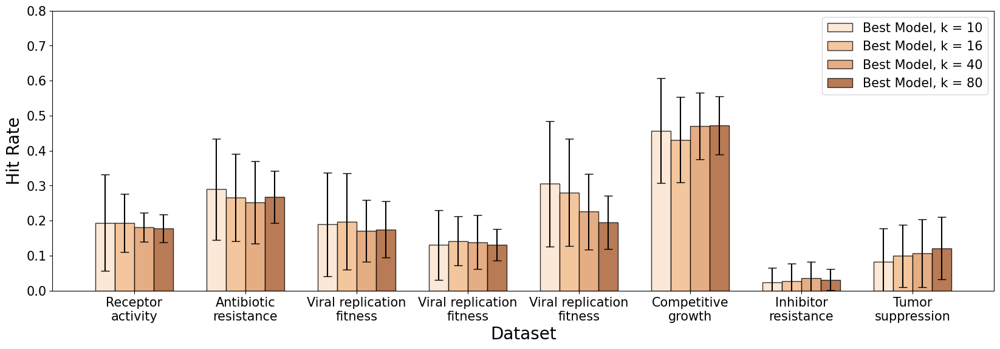

In [16]:
dataset_names = ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']
alternative_names=['Receptor\nactivity','Antibiotic\nresistance','Viral replication\nfitness','Viral replication\nfitness',
                                       'Viral replication\nfitness','Competitive\ngrowth','Inhibitor\nresistance','Tumor\nsuppression']
ks = [10,16,40,80]

width = 0.70

fig, ax = plt.subplots(figsize=(20, 6))
n = 20
for i in range(len(dataset_names)):
    name = dataset_names[i]


    best_models_ = [zsm_module.best_models_correct[name + f'_selection_n{n}'][f'ite{idx}']['overall'] for idx in range(0, 99)]

    metrics_1 = zsm_module.metric_results[name].loc[best_models_][f'hit_rate_top{ks[0]}']['avg']
    metrics_2 = zsm_module.metric_results[name].loc[best_models_][f'hit_rate_top{ks[1]}']['avg']
    metrics_3 = zsm_module.metric_results[name].loc[best_models_][f'hit_rate_top{ks[2]}']['avg']
    metrics_4 = zsm_module.metric_results[name].loc[best_models_][f'hit_rate_top{ks[3]}']['avg']



    sig1,p1 = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate[i])
    sig2,p2 = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate[i])
    sig3,p3 = one_sided_ttest_paired_1samp(metrics_3, hie_hit_rate[i])
    sig4,p4 = one_sided_ttest_paired_1samp(metrics_4, hie_hit_rate[i])

    sig1_neg,p1_neg = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate[i], alternative='less')
    sig2_neg,p2_neg = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate[i], alternative='less')
    sig3_neg,p3_neg = one_sided_ttest_paired_1samp(metrics_3, hie_hit_rate[i], alternative='less')
    sig4_neg,p4_neg = one_sided_ttest_paired_1samp(metrics_4, hie_hit_rate[i], alternative='less')

    n_bars = 4
    
    ax.bar(i+0 * width/n_bars, metrics_1.mean(), yerr=metrics_1.std(),width=width/n_bars, color="#FBE3CC", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, k = 10')
    ax.bar(i+1 * width/n_bars, metrics_2.mean(), yerr=metrics_2.std(),width=width/n_bars, color="#F2B885", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, k = 16')
    ax.bar(i+2 * width/n_bars, metrics_3.mean(), yerr=metrics_3.std(),width=width/n_bars, color="#DF9966", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, k = 40')
    ax.bar(i+3 * width/n_bars, metrics_4.mean(), yerr=metrics_4.std(),width=width/n_bars, color="#A75A2A", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, k = 80')

    # Add significance stars
    y_max = max(metrics_1.mean()+metrics_1.std(), metrics_2.mean()+metrics_2.std(), metrics_3.mean()+metrics_3.std(), metrics_4.mean()+metrics_4.std())
    y = y_max * 1.00

    for s, (sig,pval, negsig,p_val_neg) in enumerate(zip([sig1, sig2, sig3, sig4],
                                                       [p1, p2, p3, p4],
                                                       [sig1_neg, sig2_neg, sig3_neg, sig4_neg],
                                                       [p1_neg, p2_neg, p3_neg, p4_neg])):
        stars = ''
        if sig and negsig:
            stars = '≈'
            print(f'WARNING: Contradictory statistical test results for {name}, p-values: {pval} (greater), {p_val_neg} (less)')
        elif sig:
            sig_color = 'green'
            if pval < 0.001:
                stars = '***'
            elif pval < 0.01:
                stars = '**'
            elif pval < 0.05:
                stars = '*'
        elif negsig:
            sig_color = 'red'
            if p_val_neg < 0.001:
                stars = '***'
            elif p_val_neg < 0.01:
                stars = '**'
            elif p_val_neg < 0.05:
                stars = '*'
        else:
            sig_color = 'gray'
            stars = ''

        #ax.text(i+(s) * width/n_bars, y, stars, ha='center', va='bottom', color=sig_color, fontsize=12)


handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), fontsize=15)

ax.set_xlabel("Dataset",fontsize=20)
ax.set_ylabel("Hit Rate",fontsize=20)
ax.set_xticks(np.arange(len(dataset_names)) + width/2 - width/(n_bars*2))
ax.set_xticklabels(alternative_names, rotation=0, ha="center")

ax.tick_params(axis='both', which='major', labelsize=15)

ax.set_ylim(0,0.8)

(0.0, 0.8)

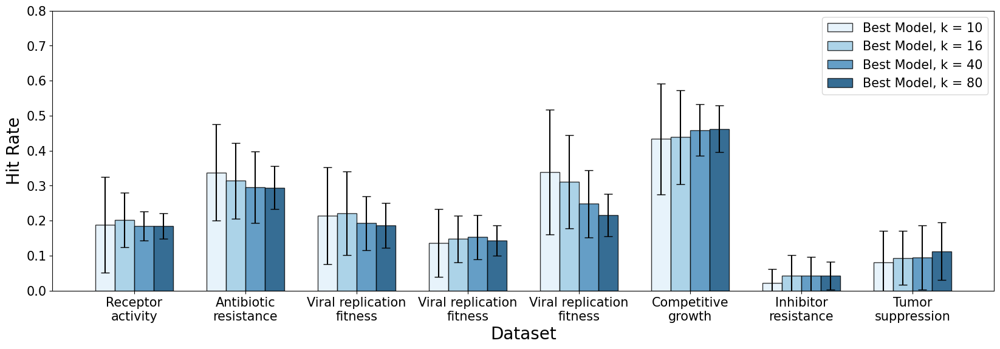

In [17]:
dataset_names = ['ADRB2_HUMAN_Jones_2020','BLAT_ECOLX_Stiffler_2015','ENV_HV1BR_Haddox_2016','A0A2Z5U3Z0_9INFA_Doud_2016','C6KNH7_9INFA_Lee_2018','IF1_ECOLI_Kelsic_2016','MK01_HUMAN_Brenan_2016','P53_HUMAN_Giacomelli_2018_Null_Etoposide']
alternative_names=['Receptor\nactivity','Antibiotic\nresistance','Viral replication\nfitness','Viral replication\nfitness',
                                       'Viral replication\nfitness','Competitive\ngrowth','Inhibitor\nresistance','Tumor\nsuppression']
ks = [10,16,40,80]

width = 0.70

fig, ax = plt.subplots(figsize=(20, 6))
n = 50
for i in range(len(dataset_names)):
    name = dataset_names[i]


    best_models_ = [zsm_module.best_models_correct[name + f'_selection_n{n}'][f'ite{idx}']['overall'] for idx in range(0, 99)]

    metrics_1 = zsm_module.metric_results[name].loc[best_models_][f'hit_rate_top{ks[0]}']['avg']
    metrics_2 = zsm_module.metric_results[name].loc[best_models_][f'hit_rate_top{ks[1]}']['avg']
    metrics_3 = zsm_module.metric_results[name].loc[best_models_][f'hit_rate_top{ks[2]}']['avg']
    metrics_4 = zsm_module.metric_results[name].loc[best_models_][f'hit_rate_top{ks[3]}']['avg']



    sig1,p1 = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate[i])
    sig2,p2 = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate[i])
    sig3,p3 = one_sided_ttest_paired_1samp(metrics_3, hie_hit_rate[i])
    sig4,p4 = one_sided_ttest_paired_1samp(metrics_4, hie_hit_rate[i])

    sig1_neg,p1_neg = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate[i], alternative='less')
    sig2_neg,p2_neg = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate[i], alternative='less')
    sig3_neg,p3_neg = one_sided_ttest_paired_1samp(metrics_3, hie_hit_rate[i], alternative='less')
    sig4_neg,p4_neg = one_sided_ttest_paired_1samp(metrics_4, hie_hit_rate[i], alternative='less')

    n_bars = 4
    
    ax.bar(i+0 * width/n_bars, metrics_1.mean(), yerr=metrics_1.std(),width=width/n_bars, color="#E1F1FA", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, k = 10')
    ax.bar(i+1 * width/n_bars, metrics_2.mean(), yerr=metrics_2.std(),width=width/n_bars, color="#98C8E3", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, k = 16')
    ax.bar(i+2 * width/n_bars, metrics_3.mean(), yerr=metrics_3.std(),width=width/n_bars, color="#3E86B8", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, k = 40')
    ax.bar(i+3 * width/n_bars, metrics_4.mean(), yerr=metrics_4.std(),width=width/n_bars, color="#03497A", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, k = 80')

    # Add significance stars
    y_max = max(metrics_1.mean()+metrics_1.std(), metrics_2.mean()+metrics_2.std(), metrics_3.mean()+metrics_3.std(), metrics_4.mean()+metrics_4.std())
    y = y_max * 1.00

    for s, (sig,pval, negsig,p_val_neg) in enumerate(zip([sig1, sig2, sig3, sig4],
                                                       [p1, p2, p3, p4],
                                                       [sig1_neg, sig2_neg, sig3_neg, sig4_neg],
                                                       [p1_neg, p2_neg, p3_neg, p4_neg])):
        stars = ''
        if sig and negsig:
            stars = '≈'
            print(f'WARNING: Contradictory statistical test results for {name}, p-values: {pval} (greater), {p_val_neg} (less)')
        elif sig:
            sig_color = 'green'
            if pval < 0.001:
                stars = '***'
            elif pval < 0.01:
                stars = '**'
            elif pval < 0.05:
                stars = '*'
        elif negsig:
            sig_color = 'red'
            if p_val_neg < 0.001:
                stars = '***'
            elif p_val_neg < 0.01:
                stars = '**'
            elif p_val_neg < 0.05:
                stars = '*'
        else:
            sig_color = 'gray'
            stars = ''

        #ax.text(i+(s) * width/n_bars, y, stars, ha='center', va='bottom', color=sig_color, fontsize=12)


handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), fontsize=15)

ax.set_xlabel("Dataset",fontsize=20)
ax.set_ylabel("Hit Rate",fontsize=20)
ax.set_xticks(np.arange(len(dataset_names)) + width/2 - width/(n_bars*2))
ax.set_xticklabels(alternative_names, rotation=0, ha="center")

ax.tick_params(axis='both', which='major', labelsize=15)

ax.set_ylim(0,0.8)

Significant difference between best and worst models for ADRB2_HUMAN_Jones_2020: True (p-value: 0.009635404232531355)


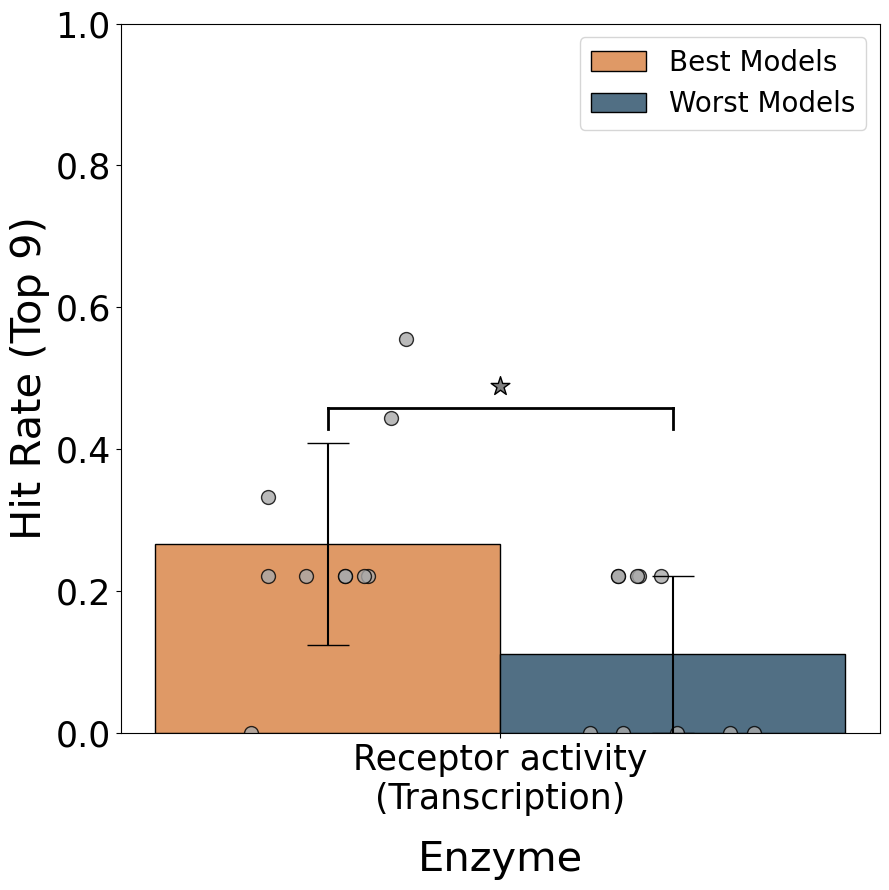

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['ADRB2_HUMAN_Jones_2020'],
                    metric = 'hit_rate_top9',xlabel='Enzyme',ylabel='Hit Rate (Top 9)',
                    alternative_names=['Receptor activity\n(Transcription)'],
                    ylimit=1, figsize=(9,9), format='svg',use_correct_best=True)

Significant difference between best and worst models for BLAT_ECOLX_Stiffler_2015: True (p-value: 1.5632433128779403e-05)


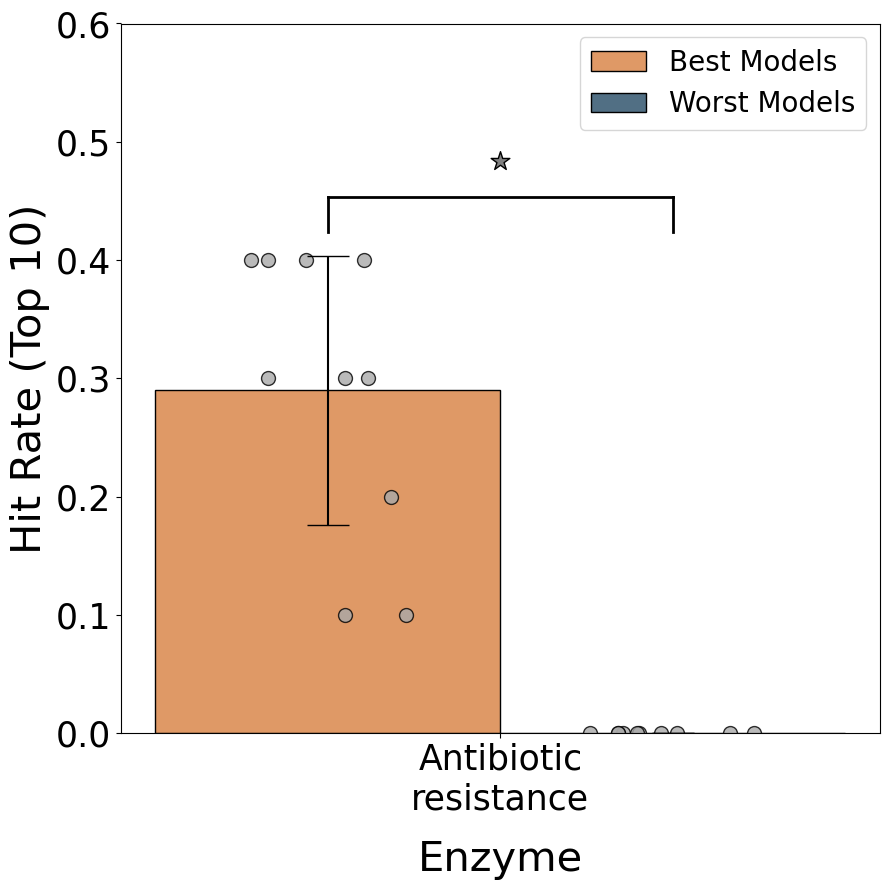

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['BLAT_ECOLX_Stiffler_2015'],
                    metric = 'hit_rate_top10',xlabel='Enzyme',ylabel='Hit Rate (Top 10)',
                    alternative_names=['Antibiotic\nresistance'],
                    ylimit=0.6, figsize=(9,9), format='svg',use_correct_best=True)

Significant difference between best and worst models for ENV_HV1BR_Haddox_2016: True (p-value: 0.0006773017906342612)


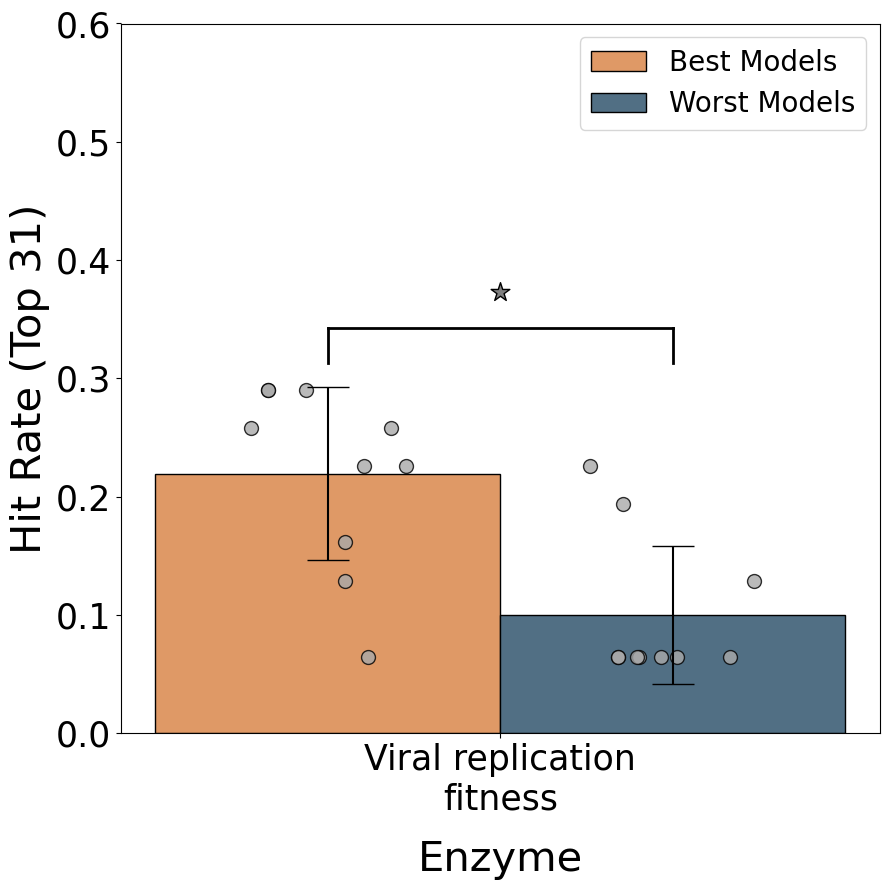

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['ENV_HV1BR_Haddox_2016'],
                    metric = 'hit_rate_top31',xlabel='Enzyme',ylabel='Hit Rate (Top 31)',
                    alternative_names=['Viral replication\nfitness'],
                    ylimit=0.6, figsize=(9,9), format='svg',use_correct_best=True)

Significant difference between best and worst models for A0A2Z5U3Z0_9INFA_Doud_2016: True (p-value: 0.00012578104624563378)


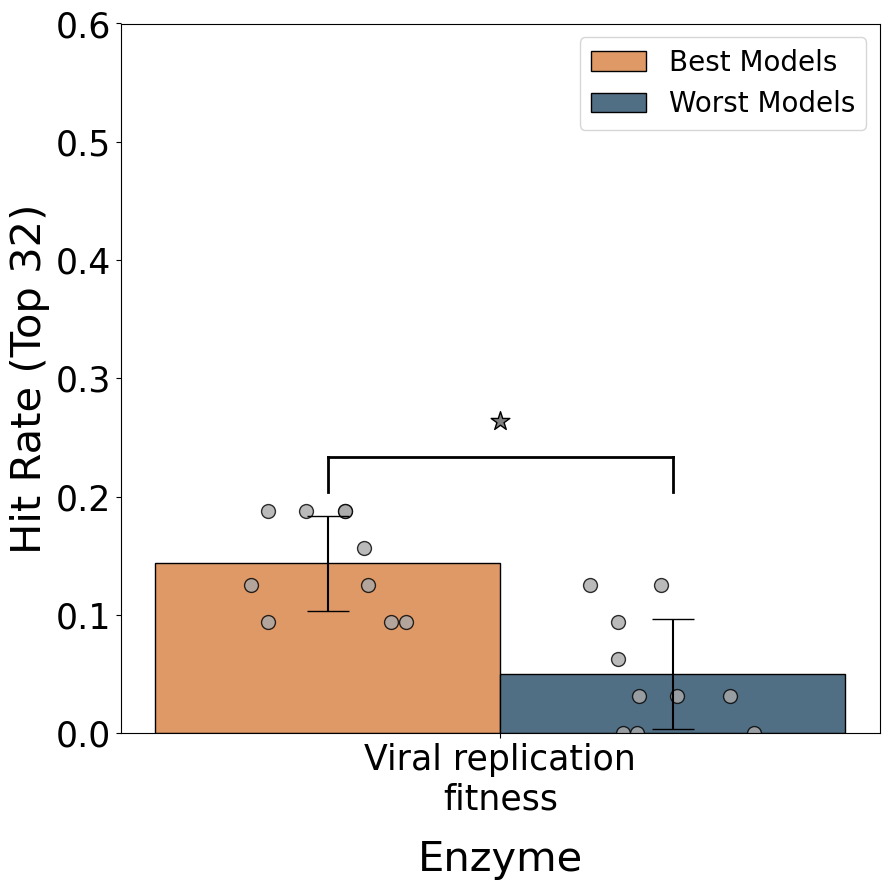

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A0A2Z5U3Z0_9INFA_Doud_2016'],
                    metric = 'hit_rate_top32',xlabel='Enzyme',ylabel='Hit Rate (Top 32)',
                    alternative_names=['Viral replication\nfitness'],
                    ylimit=0.6, figsize=(9,9), format='svg',use_correct_best=True)

Significant difference between best and worst models for C6KNH7_9INFA_Lee_2018: True (p-value: 0.006719366179446391)


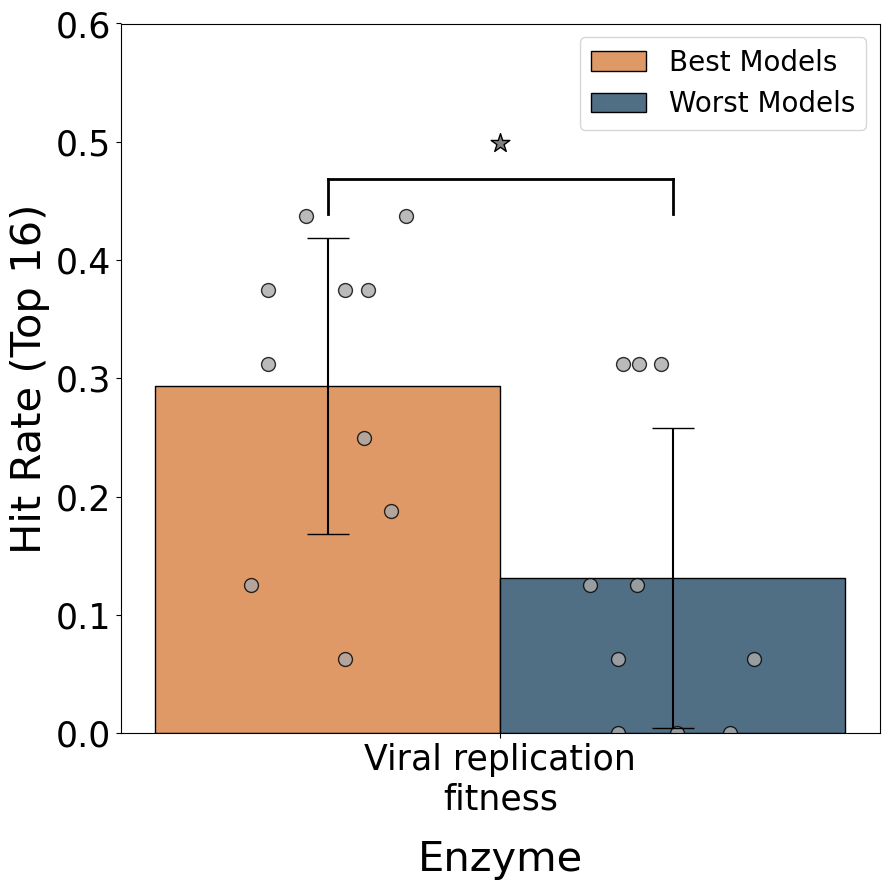

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['C6KNH7_9INFA_Lee_2018'],
                    metric = 'hit_rate_top16',xlabel='Enzyme',ylabel='Hit Rate (Top 16)',
                    alternative_names=['Viral replication\nfitness'],
                    ylimit=0.6, figsize=(9,9), format='svg',use_correct_best=True)

Significant difference between best and worst models for IF1_ECOLI_Kelsic_2016: False (p-value: 0.05478174889837425)


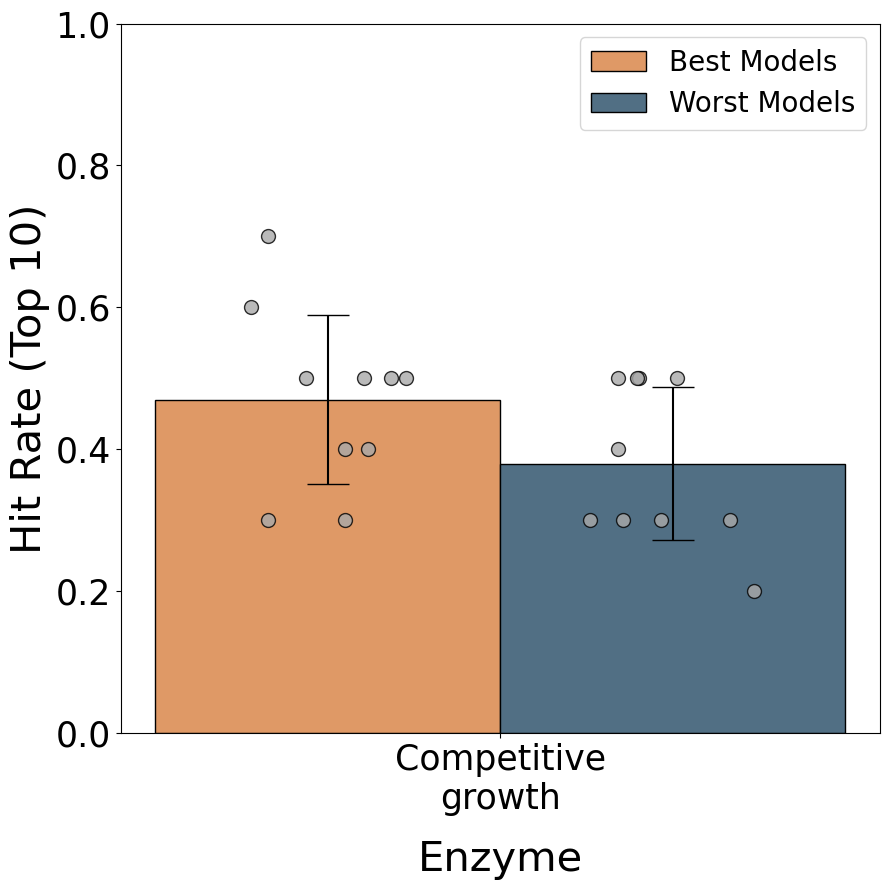

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['IF1_ECOLI_Kelsic_2016'],
                    metric = 'hit_rate_top10',xlabel='Enzyme',ylabel='Hit Rate (Top 10)',
                    alternative_names=['Competitive\ngrowth'],
                    ylimit=1, figsize=(9,9), format='svg',use_correct_best=True)

Significant difference between best and worst models for MK01_HUMAN_Brenan_2016: False (p-value: 1.0)


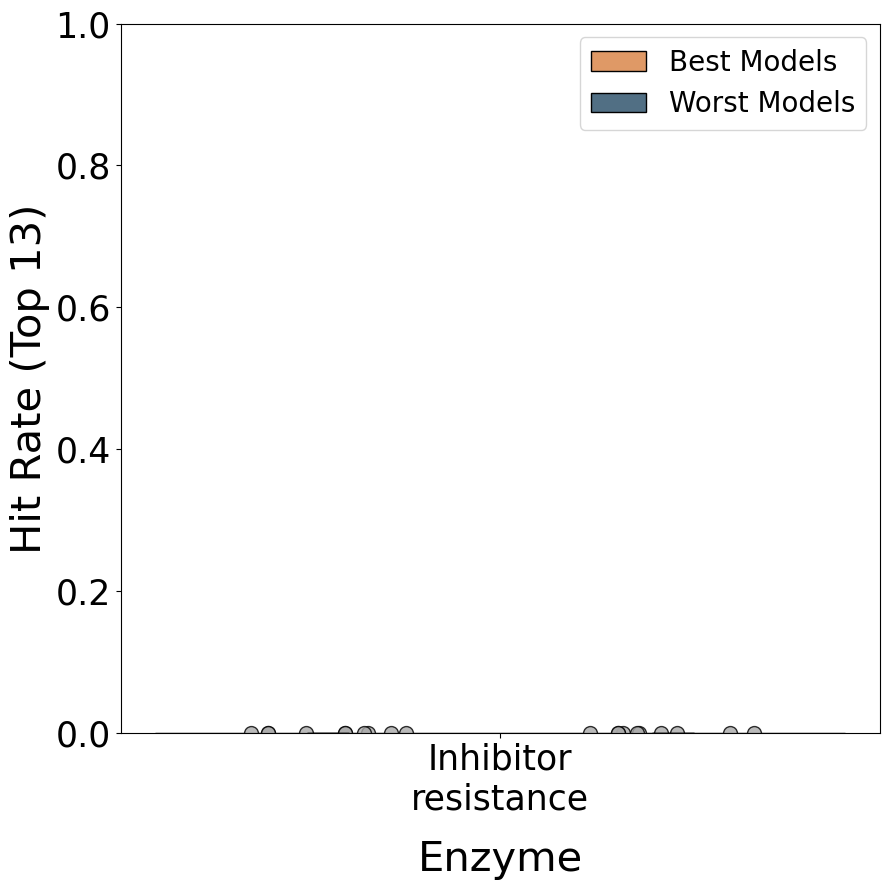

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['MK01_HUMAN_Brenan_2016'],
                    metric = 'hit_rate_top13',xlabel='Enzyme',ylabel='Hit Rate (Top 13)',
                    alternative_names=['Inhibitor\nresistance'],
                    ylimit=1, figsize=(9,9), format='svg',use_correct_best=True)

Significant difference between best and worst models for P53_HUMAN_Giacomelli_2018_Null_Etoposide: False (p-value: 1.0)


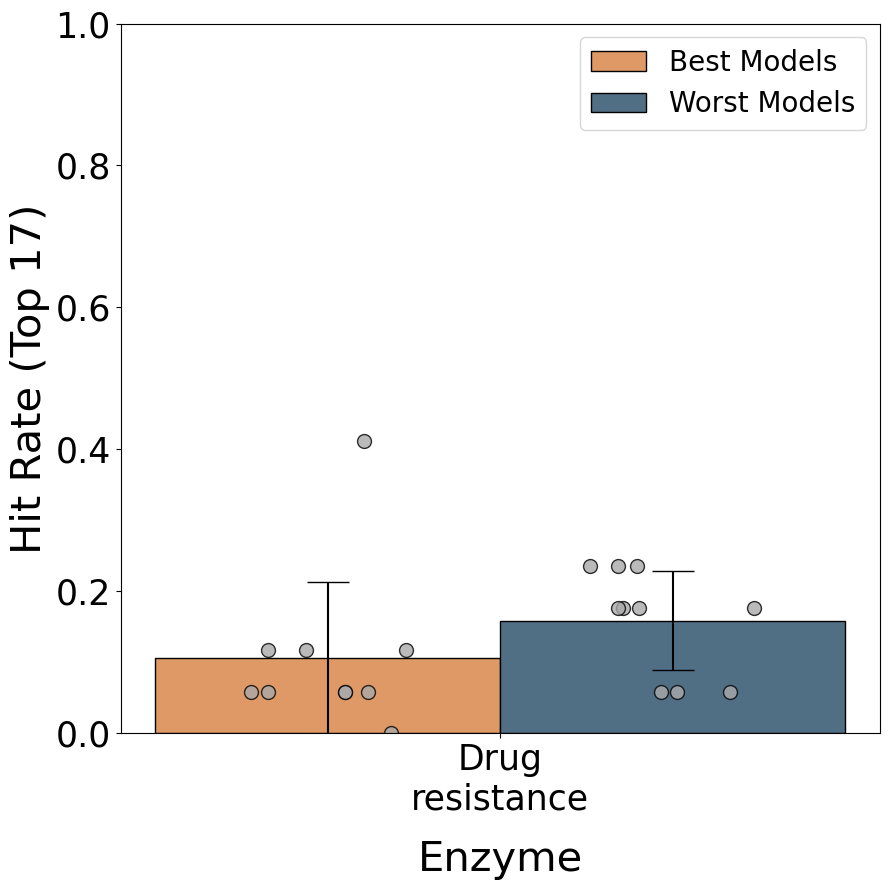

In [ ]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['P53_HUMAN_Giacomelli_2018_Null_Etoposide'],
                    metric = 'hit_rate_top17',xlabel='Enzyme',ylabel='Hit Rate (Top 17)',
                    alternative_names=['Drug\nresistance'],
                    ylimit=1, figsize=(9,9), format='svg',use_correct_best=True)

### Recreating their workflow

In [7]:
zsm_module.set_threshold('A4_HUMAN_Seuma_2022',-2.000000)
zsm_module.set_threshold('ADRB2_HUMAN_Jones_2020',1.859962)
zsm_module.set_threshold('ESTA_BACSU_Nutschel_2020',46.340000)
zsm_module.set_threshold('MK01_HUMAN_Brenan_2016',-8.040791)
zsm_module.set_threshold('SC6A4_HUMAN_Young_2021',-0.156069)
zsm_module.set_threshold('SPIKE_SARS2_Starr_2020_binding',-0.500000)
zsm_module.set_threshold('YAP1_HUMAN_Araya_2012',0.623640)
zsm_module.set_threshold('ANCSZ_Hobbs_2022',-0.0574121626)
zsm_module.set_threshold('Q59976_STRSQ_Romero_2015',-1.0)
zsm_module.set_threshold('VKOR1_HUMAN_Chiasson_2020_activity',0.7)

In [8]:
zsm_module.load_scores('A4_HUMAN_Seuma_2022',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('ADRB2_HUMAN_Jones_2020',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('ESTA_BACSU_Nutschel_2020',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('MK01_HUMAN_Brenan_2016',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('SC6A4_HUMAN_Young_2021',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('SPIKE_SARS2_Starr_2020_binding',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('YAP1_HUMAN_Araya_2012',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('ANCSZ_Hobbs_2022',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('Q59976_STRSQ_Romero_2015',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])
zsm_module.load_scores('VKOR1_HUMAN_Chiasson_2020_activity',wt=False,model_list=['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5'])

In [9]:
datasets = ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
            'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012',
            'ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']
from collections import Counter
alpha = 1
results_df = pd.DataFrame(index=datasets, columns=['sample_size','sample_success','hit_rate','pop_size','pop_success','background','k'])
for dataset in datasets:
    exp_data_bin = zsm_module.datasets[dataset]['exp_data']['DMS_score_bin']
    pop_size = len(exp_data_bin)
    pop_success = exp_data_bin.sum()
    background = exp_data_bin.mean()
    better_than_wt = []
    raw_scores = {}
    for model in ['ESM1b','ESM1v_1','ESM1v_2','ESM1v_3','ESM1v_4','ESM1v_5']:
        raw_ = zsm_module.datasets[dataset][model][model].apply(lambda x: np.exp(x))
        raw_scores[model] = raw_
        better_ = raw_[raw_ >= alpha]
        # Append indices of sequences better than wt to a common list
        better_than_wt.extend(better_.index.tolist())
    k = 2
    # Get indices of variants that are better than wt in at least k models
    count = Counter(better_than_wt)
    better_than_wt_k = [idx for idx, c in count.items() if c >= k]

    # If number of candidates is less than 5, set k to 1
    if len(better_than_wt_k) < 5:
        k = 1
        better_than_wt_k = [idx for idx, c in count.items() if c >= k]

    # If number of candidates is > 40, increase k until number of candidates is <= 40
    while len(better_than_wt_k) > 40 and k < 6:
        k += 1
        better_than_wt_k = [idx for idx, c in count.items() if c >= k]

    if len(better_than_wt_k) == 0:
        k = 0
        better_than_wt_k = []

    print(f'Final k for dataset {dataset} is {k} with {len(better_than_wt_k)} candidates')


    # Calculate fraction of true beneficial mutations among those predicted to be better than wt
    candidates = exp_data_bin[better_than_wt_k]
    sample_size = len(candidates)
    sample_success = candidates.sum() if sample_size > 0 else 0
    hit_rate = candidates.mean() if sample_size > 0 else 0.0

    results_df.loc[dataset] = [sample_size, sample_success, hit_rate, pop_size, pop_success, background, k]






Final k for dataset A4_HUMAN_Seuma_2022 is 1 with 6 candidates
Final k for dataset ADRB2_HUMAN_Jones_2020 is 6 with 5 candidates
Final k for dataset ESTA_BACSU_Nutschel_2020 is 6 with 3 candidates
Final k for dataset MK01_HUMAN_Brenan_2016 is 4 with 23 candidates
Final k for dataset SC6A4_HUMAN_Young_2021 is 6 with 19 candidates
Final k for dataset SPIKE_SARS2_Starr_2020_binding is 0 with 0 candidates
Final k for dataset YAP1_HUMAN_Araya_2012 is 2 with 14 candidates
Final k for dataset ANCSZ_Hobbs_2022 is 6 with 6 candidates
Final k for dataset Q59976_STRSQ_Romero_2015 is 6 with 13 candidates
Final k for dataset VKOR1_HUMAN_Chiasson_2020_activity is 4 with 31 candidates


In [10]:
zsm_module.load_scores('A4_HUMAN_Seuma_2022',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('ADRB2_HUMAN_Jones_2020',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('ESTA_BACSU_Nutschel_2020',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('MK01_HUMAN_Brenan_2016',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('SC6A4_HUMAN_Young_2021',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('SPIKE_SARS2_Starr_2020_binding',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('YAP1_HUMAN_Araya_2012',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('ANCSZ_Hobbs_2022',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('Q59976_STRSQ_Romero_2015',wt=True,model_list=model_list,wt_external=True)
zsm_module.load_scores('VKOR1_HUMAN_Chiasson_2020_activity',wt=True,model_list=model_list,wt_external=True)

In [12]:
for prot in datasets:
    exp_ = zsm_module.datasets[prot]['exp_data']
    exp_ = exp_[exp_['mutant'].str.contains('WT')==False]
    np.random.seed(19)#(24)
    for n in [20,50]:
        zsm_module.set_threshold(f'{prot}_selection_n{n}',zsm_module.threshold[f'{prot}'])
        zsm_module.model_list[f'{prot}_selection_n{n}'] = zsm_module.model_list[prot]
        zsm_module.name_list[f'{prot}_selection_n{n}'] = zsm_module.name_list[prot]
        zsm_module.datasets[f'{prot}_selection_n{n}'] = {}
        mutants_sel = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
        for i in range(iterations-1):
            mut_ = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
            if exp_.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_.loc[mut_]["DMS_score_bin"].mean() == 1:
                print(f'WARNING: ALL SAME CLASS FOR {prot} with n={n} in iteration {i}, RESAMPLING')
                while exp_.loc[mut_]["DMS_score_bin"].mean() == 0 or exp_.loc[mut_]["DMS_score_bin"].mean() == 1:
                    mut_ = resample(exp_.index,n_samples=n,replace=False).tolist()#,stratify=exp_['DMS_score_bin']
            mutants_sel += mut_
        data_ = exp_.loc[mutants_sel].reset_index()
        data_ = data_.drop(columns=['index','DMS_score_bin'])
        data_['DMS_score_bin'] = data_['DMS_score'].apply(lambda x: 1 if x > zsm_module.threshold[f'{prot}_selection_n{n}'] else 0)
        zsm_module.datasets[f'{prot}_selection_n{n}']['exp_data'] = data_
        for model in zsm_module.name_list[prot]:
            data_ = zsm_module.datasets[prot][model]
            data_ = data_.loc[mutants_sel].reset_index()
            zsm_module.datasets[f'{prot}_selection_n{n}'][model] = data_.drop(columns='index')

In [13]:
for prot in datasets:
    for n in [20,50]:
        zsm_module.compute_metrics_iterations(f'{prot}_selection_n{n}',n_bootstrap=n_bootstrap,ite_size=n,metrics=['spearmanr','average_precision'],iterations=iterations)
        zsm_module.process_models_iteration(f'{prot}_selection_n{n}',iterations=iterations,ite_size=n)

c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:770: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'avg')] = corr_list_
c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:771: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  metric_results_df[(met_name, f'ite{i}', 'std')] = std_list_
c:\Users\dhard\GitHub\PRIZM-private\notebooks\src\PRIZM_classes.py:772: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert`

In [14]:
for dataset in datasets:
    #k = results_df.loc[dataset]['sample_size']
    k = 10
    best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n20'][f'ite0'].values()))
    zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=[k], previous_metrics=zsm_module.metric_results[dataset+'_selection_n20'], above_wt=False,custom_name=f'ite0_n20')
    for i in range(1,iterations):
        best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n20'][f'ite{i}'].values()))
        zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=[k], previous_metrics=zsm_module.metric_results[dataset+'_selection_n20'],previous_hitrate_multi=True,above_wt=False, custom_name=f'ite{i}_n20')

    for i in range(iterations):
        best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n50'][f'ite{i}'].values()))
        zsm_module.compute_hit_rate_multi(dataset, best_models_,n_bootstrap=n_bootstrap, ks=[k], previous_metrics=zsm_module.metric_results[dataset+'_selection_n50'],previous_hitrate_multi=True,above_wt=False, custom_name=f'ite{i}_n50')

In [15]:
#datasets = ['A4_HUMAN_Seuma_2022','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016','SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012']
from collections import Counter

results_PRIZM = pd.DataFrame(index=datasets, columns=['hit_rate','std'])
hit_rates_dict = {}
for dataset in datasets:
    exp_data_bin = zsm_module.datasets[dataset]['exp_data']['DMS_score_bin']
    pop_size = len(exp_data_bin)
    pop_success = exp_data_bin.sum()
    background = exp_data_bin.mean()
    hit_rates = []
    for i in range(iterations):
        best_models_ = np.unique(list(zsm_module.best_models_correct[dataset+'_selection_n50'][f'ite{i}'].values()))
        better_than_wt = []

        for model in best_models_:
            wt_value = zsm_module.wildtype[dataset][model][model].values[0]
            scores = zsm_module.datasets[dataset][model][model]

            better_ = scores[scores >= wt_value]
            # Append indices of sequences better than wt to a common list
            better_than_wt.extend(better_.index.tolist())
            k = 2
            # Get indices of variants that are better than wt in at least k models
            count = Counter(better_than_wt)
            better_than_wt_k = [idx for idx, c in count.items() if c >= k]

            # If number of candidates is less than 4, set k to 1
            if len(better_than_wt_k) < 5:
                k = 1
                better_than_wt_k = [idx for idx, c in count.items() if c >= k]

            # If number of candidates is > 40, increase k until number of candidates is <= 40
            while len(better_than_wt_k) > 40 and k < len(best_models_):
                k += 1
                better_than_wt_k = [idx for idx, c in count.items() if c >= k]

            if len(better_than_wt_k) == 0:
                k = 0
                better_than_wt_k = []

    


        # Calculate fraction of true beneficial mutations among those predicted to be better than wt
        candidates = exp_data_bin[better_than_wt_k]
        sample_size = len(candidates)
        #sample_success = candidates.sum() if sample_size > 0 else 0
        hit_rate = candidates.mean() if sample_size > 0 else 0.0
        hit_rates.append(hit_rate)
        
    hit_rates_dict[dataset] = np.array(hit_rates)

    hit_rate_avg = np.mean(hit_rates)
    hit_rate_std = np.std(hit_rates)
    
    results_PRIZM.loc[dataset] = [hit_rate_avg, hit_rate_std]

c:\Users\dhard\anaconda3\envs\PRIZM_notebook\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


(0.0, 1.5)

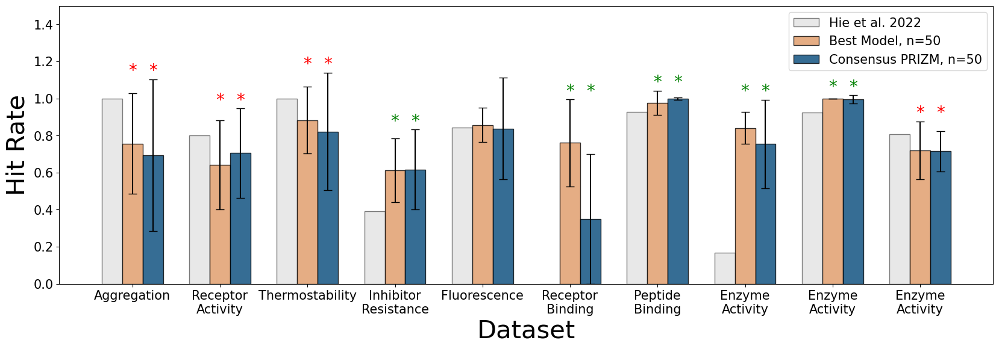

In [24]:
width = 0.70
alternative_names = ['Aggregation','Receptor\nActivity','Thermostability','Inhibitor\nResistance',
                                       'Fluorescence','Receptor\nBinding','Peptide\nBinding',
                                       "Enzyme\nActivity",'Enzyme\nActivity','Enzyme\nActivity']
fig, ax = plt.subplots(figsize=(20, 6))
for i in range(len(datasets)):
    name = datasets[i]
    #k = results_df.loc[name]['sample_size']
    k = 10
    hie_hit_rate_ = results_df['hit_rate'][name]

    index1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].index.str.contains('n50')
    
    metrics_1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].loc[index1]['avg']
    metrics_2 = hit_rates_dict[name]
    
    sig1,p1 = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate_)
    sig2,p2 = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate_)

    sig1_neg,p1_neg = one_sided_ttest_paired_1samp(metrics_1, hie_hit_rate_, alternative='less')
    sig2_neg,p2_neg = one_sided_ttest_paired_1samp(metrics_2, hie_hit_rate_, alternative='less')


    n_bars = 3
    
    ax.bar(i+0 * width/n_bars,hie_hit_rate_,width=width/n_bars,color='lightgray', alpha=0.5, capsize=5,edgecolor='k', label='Hie et al. 2022')
    ax.bar(i+1 * width/n_bars, metrics_1.mean(), yerr=metrics_1.std(),width=width/n_bars, color="#DF9966", alpha=0.8, capsize=5,edgecolor='k',label='Best Model, n=50')
    ax.bar(i+2 * width/n_bars, metrics_2.mean(), yerr=metrics_2.std(),width=width/n_bars, color="#03497A", alpha=0.8, capsize=5,edgecolor='k',label='Consensus PRIZM, n=50')

    # Add significance stars
    y_max = max(hie_hit_rate_, metrics_1.mean()+metrics_1.std(), metrics_2.mean()+metrics_2.std())
    y = y_max * 1.00

    for s, (sig,pval, negsig,p_val_neg) in enumerate(zip([sig1, sig2],
                                                       [p1, p2],
                                                       [sig1_neg, sig2_neg],
                                                       [p1_neg, p2_neg])):
        stars = ''
        if sig and negsig:
            stars = '≈'
            print(f'WARNING: Contradictory statistical test results for {name}, p-values: {pval} (greater), {p_val_neg} (less)')
        elif sig:
            sig_color = 'green'
            stars = '*'
            # if pval < 0.00001:
            #     stars = '***'
            # elif pval < 0.0001:
            #     stars = '**'
            # elif pval < 0.001:
            #     stars = '*'
        elif negsig:
            sig_color = 'red'
            stars = '*'
            # if p_val_neg < 0.00001:
            #     stars = '***'
            # elif p_val_neg < 0.0001:
            #     stars = '**'
            # elif p_val_neg < 0.001:
            #     stars = '*'
        else:
            sig_color = 'gray'
            stars = ''

        ax.text(i+(s+1) * width/n_bars, y, stars, ha='center', va='bottom', color=sig_color, fontsize=20)


handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), fontsize=15)

ax.set_xlabel("Dataset",fontsize=30)
ax.set_ylabel("Hit Rate",fontsize=30)
ax.set_xticks(np.arange(len(datasets)) + width/2 - width/(n_bars*2))
ax.set_xticklabels(alternative_names, rotation=0, ha="center")

ax.tick_params(axis='both', which='major', labelsize=15)

ax.set_ylim(0,1.5)

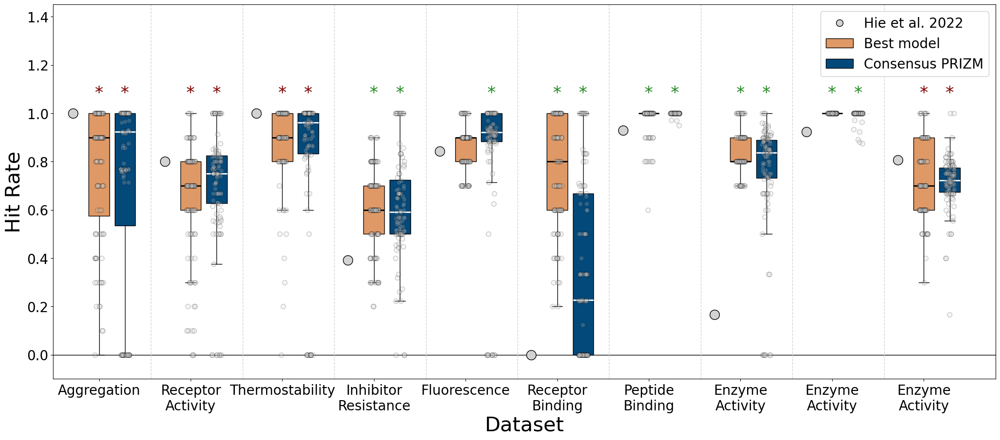

In [18]:
from scipy.stats import mannwhitneyu
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

width = 0.85

alternative_names = ['Aggregation','Receptor\nActivity','Thermostability','Inhibitor\nResistance',
                                       'Fluorescence','Receptor\nBinding','Peptide\nBinding',
                                       "Enzyme\nActivity",'Enzyme\nActivity','Enzyme\nActivity']

fig, ax = plt.subplots(figsize=(25, 10))
# Plot axline at y = 0
ax.axhline(0, color='k', linewidth=1, linestyle='-', zorder=0)

for i in range(len(datasets)):
    name = datasets[i]
    # k = results_df.loc[name]['sample_size']
    k = 10
    hie_hit_rate_ = results_df['hit_rate'][name]   # baseline (single deterministic value)

    # Subset PRIZM runs
    index1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].index.str.contains('n50')
    metrics_1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].loc[index1]['avg']     # Best model
    metrics_2 = hit_rates_dict[name]                                                     # Consensus PRIZM

    # Statistical comparison: Mann–Whitney U (one-sided PRIZM > Hie)
    # Hie is deterministic so we compare against a list of repeated values
    baseline_arr = np.repeat(hie_hit_rate_, len(metrics_1))

    # tests for Best model
    u1, p1 = mannwhitneyu(metrics_1, baseline_arr, alternative="greater")
    u1_neg, p1_neg = mannwhitneyu(metrics_1, baseline_arr, alternative="less")

    # tests for Consensus PRIZM
    baseline_arr = np.repeat(hie_hit_rate_, len(metrics_2))
    u2, p2 = mannwhitneyu(metrics_2, baseline_arr, alternative="greater")
    u2_neg, p2_neg = mannwhitneyu(metrics_2, baseline_arr, alternative="less")

    # Draw groups
    n_bars = 3
    base_x = i

    # --- HIE baseline (single scatter point) ---
    ax.scatter(base_x + 0 * width/n_bars,
               hie_hit_rate_,
               color='lightgray', s=200, zorder=5,
               label='Hie et al. 2022' if i == 0 else "",
               edgecolor='k')

    # --- Jittered points for metrics_1 and metrics_2 ---
    jitter_strength = 0.05
    np.random.seed(42 + i)  # for reproducibility
    x_jitter_1 = np.random.uniform(-jitter_strength, jitter_strength, size=len(metrics_1))
    x_jitter_2 = np.random.uniform(-jitter_strength, jitter_strength, size=len(metrics_2))

    # Plot individual points for Best model
    ax.scatter(np.full_like(metrics_1, base_x + 1 * width/n_bars) + x_jitter_1,
               metrics_1,
               color='lightgray', alpha=0.2, edgecolor='k', s=50, zorder=4)
    # Plot individual points for Consensus PRIZM
    ax.scatter(np.full_like(metrics_2, base_x + 2 * width/n_bars) + x_jitter_2,
               metrics_2,
               color='lightgray', alpha=0.2, edgecolor='k', s=50, zorder=4)

    # --- Box plots instead of manual median/IQR lines ---
    pos_best = base_x + 1 * width/n_bars
    pos_cons = base_x + 2 * width/n_bars
    box_width = (width / n_bars) * 0.8

    # Best model box
    ax.boxplot(
        metrics_1,
        positions=[pos_best],
        widths=box_width,
        patch_artist=True,
        boxprops=dict(facecolor="#DF9966", color='k'),
        medianprops=dict(color='k', linewidth=2),
        whiskerprops=dict(color="k"),
        capprops=dict(color="k"),
        flierprops=dict(marker='')
    )

    # Consensus PRIZM box
    ax.boxplot(
        metrics_2,
        positions=[pos_cons],
        widths=box_width,
        patch_artist=True,
        boxprops=dict(facecolor="#03497A", color='k'),
        medianprops=dict(color='w', linewidth=2),
        whiskerprops=dict(color="k"),
        capprops=dict(color="k"),
        flierprops=dict(marker='')
    )

    # --- Significance stars (unchanged from your logic) ---
    y_max = 1.05
    for s, (p_greater, p_less) in enumerate([(p1, p1_neg),
                                             (p2, p2_neg)]):
        # Determine stars & direction
        if p_greater < 0.0001:
            stars, color = '*', 'forestgreen'
        elif p_less < 0.0001:
            stars, color = '*', 'maroon'
        else:
            stars, color = '', 'gray'

        ax.text(base_x + (s+1) * width/n_bars,
                y_max, stars,
                color=color, ha='center', va='bottom',
                fontsize=25)

# --- Legend (custom, since boxplot doesn't auto-label nicely) ---
baseline_handle = Line2D([0], [0],
                         marker='o', linestyle='',
                         markerfacecolor='lightgray', markeredgecolor='k',
                         markersize=10, label='Hie et al. 2022')
best_handle = Patch(facecolor="#DF9966", edgecolor='k', label='Best model')
cons_handle = Patch(facecolor="#03497A", edgecolor='k', label='Consensus PRIZM')

legend = ax.legend(handles=[baseline_handle, best_handle, cons_handle], fontsize=20)
legend.get_frame().set_alpha(None)

# Axes and labels
ax.set_xlabel("Dataset", fontsize=30)
ax.set_ylabel("Hit Rate", fontsize=30)
ax.set_xticks(np.arange(len(datasets)) + width/2 - width/(n_bars*2))
ax.set_xticklabels(alternative_names, fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_ylim(-0.1, 1.45)

# Add lines between groups for each dataset
for i in range(len(datasets) - 1):
    x = i + width
    ax.plot([x, x], [-0.1, 1.5], color='lightgray', linestyle='--', linewidth=1, zorder=0)

plt.show()


In [77]:
def cliffs_delta(x, y):
    """
    Compute Cliff's delta effect size for two arrays x and y.
    Returns delta and magnitude string.
    """
    import numpy as np

    x = np.asarray(x)
    y = np.asarray(y)

    n_x = len(x)
    n_y = len(y)
    greater = 0
    lesser = 0

    for xi in x:
        greater += np.sum(xi > y)
        lesser += np.sum(xi < y)

    delta = (greater - lesser) / (n_x * n_y)

    # Interpretation
    ad = abs(delta)
    if ad < 0.147:
        mag = "negligible"
    elif ad < 0.33:
        mag = "small"
    elif ad < 0.474:
        mag = "medium"
    else:
        mag = "large"

    return delta, mag


c:\Users\dhard\anaconda3\envs\PRIZM_notebook\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


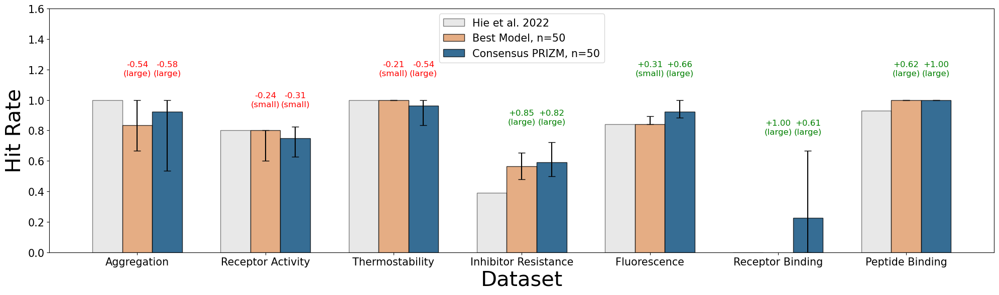

In [78]:
from scipy.stats import mannwhitneyu

width = 0.70
alternative_names = ['Aggregation','Receptor Activity','Thermostability','Inhibitor Resistance',
                     'Fluorescence','Receptor Binding','Peptide Binding']

fig, ax = plt.subplots(figsize=(20, 6))

for i in range(len(datasets)):
    name = datasets[i]
    k = results_df.loc[name]['sample_size']
    hie_hit_rate_ = results_df['hit_rate'][name]   # baseline (single deterministic value)

    # Subset PRIZM runs
    index1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].index.str.contains('n50')
    metrics_1 = zsm_module.hit_rate_multi[name][f'hit_rate_top{k}'].loc[index1]['avg']     # Best model
    metrics_2 = hit_rates_dict[name]                                                     # Consensus PRIZM

    # Compute medians
    med1 = np.median(metrics_1)
    med2 = np.median(metrics_2)

    # Compute IQRs
    q1_1, q3_1 = np.percentile(metrics_1, [25, 75])
    q1_2, q3_2 = np.percentile(metrics_2, [25, 75])

    iqr1_lower = med1 - q1_1
    iqr1_upper = q3_1 - med1
    iqr2_lower = med2 - q1_2
    iqr2_upper = q3_2 - med2

    # Statistical comparison: Cliff–Delta (PRIZM > Hie)
    # Compute Cliff’s Delta
    delta1, mag1 = cliffs_delta(metrics_1, [hie_hit_rate_]*len(metrics_1))
    delta2, mag2 = cliffs_delta(metrics_2, [hie_hit_rate_]*len(metrics_2))

    # Choose colors by direction
    def effect_color(delta):
        if delta > 0:
            return "green"   # PRIZM better
        elif delta < 0:
            return "red"     # PRIZM worse
        else:
            return "gray"    # negligible

    col1 = effect_color(delta1)
    col2 = effect_color(delta2)

    # Build labels like "+0.21 (medium)"
    label1 = f"{delta1:+.2f}\n({mag1})"
    label2 = f"{delta2:+.2f}\n({mag2})"

    # Draw bars
    n_bars = 3
    base_x = i

    # HIE baseline (gray, no variability)
    ax.bar(base_x + 0 * width/n_bars, 
           hie_hit_rate_, 
           width=width/n_bars, 
           color='lightgray', alpha=0.5, edgecolor='k',
           label='Hie et al. 2022' if i == 0 else "")

    # Best model (median + IQR)
    ax.bar(base_x + 1 * width/n_bars, 
           med1, 
           width=width/n_bars, 
           yerr=[[iqr1_lower], [iqr1_upper]], 
           color="#DF9966", alpha=0.8, edgecolor='k', 
           capsize=5, 
           label='Best Model, n=50' if i == 0 else "")

    # Consensus PRIZM
    ax.bar(base_x + 2 * width/n_bars, 
           med2, 
           width=width/n_bars, 
           yerr=[[iqr2_lower], [iqr2_upper]], 
           color="#03497A", alpha=0.8, edgecolor='k',
           capsize=5, 
           label='Consensus PRIZM, n=50' if i == 0 else "")

    # y-value for significance annotations
    y_max = max(hie_hit_rate_, q3_1, q3_2) * 1.15

    # Position above bars
    ax.text(base_x + 1 * width/n_bars, y_max, label1,
            ha='center', va='bottom', color=col1, fontsize=12)

    ax.text(base_x + 2 * width/n_bars, y_max, label2,
            ha='center', va='bottom', color=col2, fontsize=12)


# Legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, fontsize=15)

# Axes and labels
ax.set_xlabel("Dataset", fontsize=30)
ax.set_ylabel("Hit Rate", fontsize=30)
ax.set_xticks(np.arange(len(datasets)) + width/2 - width/(n_bars*2))
ax.set_xticklabels(alternative_names, fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_ylim(0, 1.6)

fig.tight_layout()
plt.show()
